In [2]:
!apt-get install git -y

!git clone https://github.com/IAmReallyAlessio/AML-Challenges.git

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
git is already the newest version (1:2.34.1-1ubuntu1.12).
0 upgraded, 0 newly installed, 0 to remove and 122 not upgraded.
Cloning into 'AML-Challenges'...
remote: Enumerating objects: 30324, done.
remote: Counting objects: 100% (4/4), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 30324 (delta 1), reused 0 (delta 0), pack-reused 30320 (from 4)
Receiving objects: 100% (30324/30324), 128.59 MiB | 38.97 MiB/s, done.
Resolving deltas: 100% (18468/18468), done.
Updating files: 100% (30238/30238), done.


In [38]:
!pip install opencv-python

In [39]:
import numpy as np
import pandas as pd
import os
import torch
from torchvision import datasets
from torchvision.transforms import v2 as transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import matplotlib.pyplot as plt
from tqdm import tqdm
from pathlib import PurePosixPath, PureWindowsPath

In [40]:
class CustomImageDataset(Dataset):
    def __init__(self, csv_file, img_dir, transform=None):
        self.annotations = pd.read_csv(csv_file)
        self.img_dir = img_dir
        self.transform = transform

    def __len__(self):
        return len(self.annotations)

    def __getitem__(self, idx):
        img_name = self.annotations.iloc[idx, 0]
        label = int(self.annotations.iloc[idx, 1])
        img_path = os.path.join(self.img_dir, img_name)

        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label


class UnlabeledImageDataset(Dataset):
    def __init__(self, img_dir, return_label=0.5, transform=None):
        self.images = [file.name for file in os.scandir(img_dir)]
        self.img_dir = str(img_dir)
        self.transform = transform
        self.return_label = return_label

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_name = self.images[idx]

        image = Image.open(os.path.join(self.img_dir, img_name)).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, self.return_label

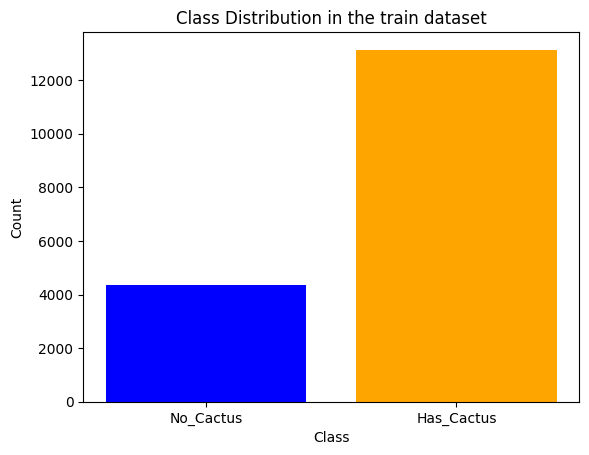

In [41]:
count_0 = 4364  # -> 12000/13000
count_1 = 13136

plt.bar(['No_Cactus', 'Has_Cactus'], [count_0, count_1], color=['blue', 'orange'])
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Class Distribution in the train dataset')
plt.show()

In [42]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToImage(),
    transforms.ToDtype(torch.float32, scale=True),
])

csv_file = PurePosixPath("/kaggle/working/AML-Challenges/challenge1/data/train.csv")
if os.name == 'nt':
    csv_file = PureWindowsPath(csv_file)

train_dir = PurePosixPath("/kaggle/working/AML-Challenges/challenge1/data/train/train")
if os.name == 'nt':
    train_dir = PureWindowsPath(train_dir)

augmented_folder = PurePosixPath("/kaggle/working/AML-Challenges/challenge1/data/train/train_augmented")
if os.name == 'nt':
    augmented_folder = PureWindowsPath(augmented_folder)

test_dir = PurePosixPath("/kaggle/working/AML-Challenges/challenge1/data/test/test")
if os.name == 'nt':
    test_dir = PureWindowsPath(test_dir)

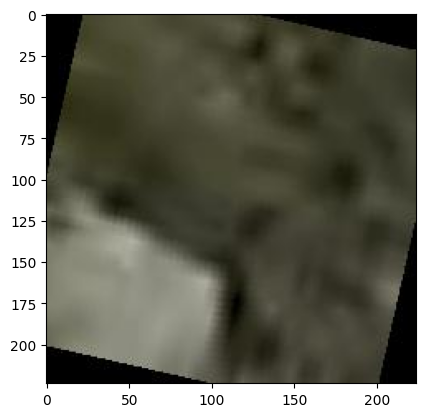

In [43]:
train_dataset = CustomImageDataset(
    csv_file=csv_file,
    img_dir=train_dir,
    transform=transform
)

augmented_dataset = UnlabeledImageDataset(
    img_dir=augmented_folder,
    return_label=0,
    transform=transforms.Compose([transforms.ToImage(), transforms.ToDtype(torch.float32, scale=True)])
)

training_dataset = torch.utils.data.ConcatDataset([train_dataset, augmented_dataset])
training_dataloader = DataLoader(training_dataset, batch_size=32, shuffle=True)


for (i, (images, labels)) in enumerate(training_dataloader):
    for (img, label) in zip(images, labels):
        if label == 0:
            plt.imshow(img.permute(1, 2, 0))
            break
    break

Label: 0, Lines: 4, edge_density7.236926020408164, Dominant direction:0.0


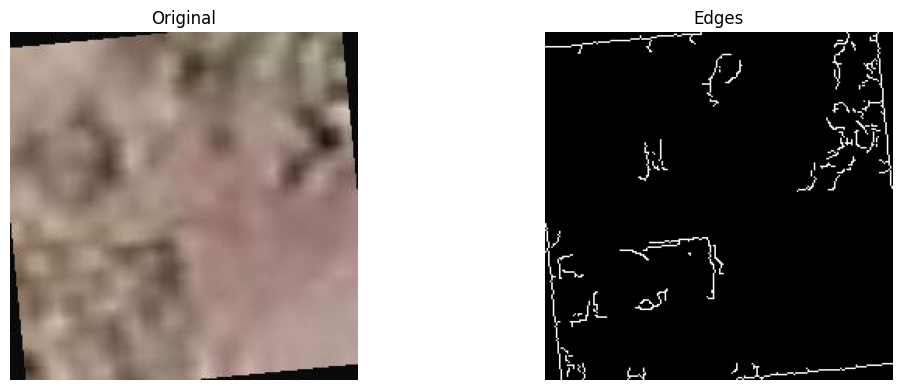

Label: 0, Lines: 0, edge_density0.16770966198979592, Dominant direction:0.0


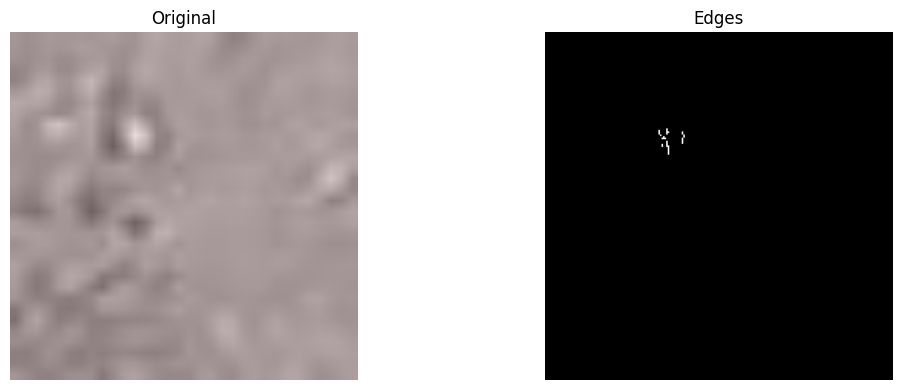

Label: 0, Lines: 4, edge_density6.7236328125, Dominant direction:0.0


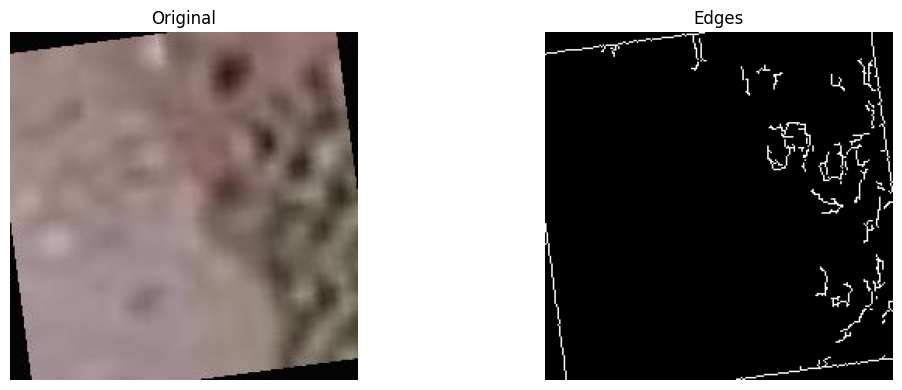

Label: 0, Lines: 5, edge_density6.439034598214286, Dominant direction:0.0


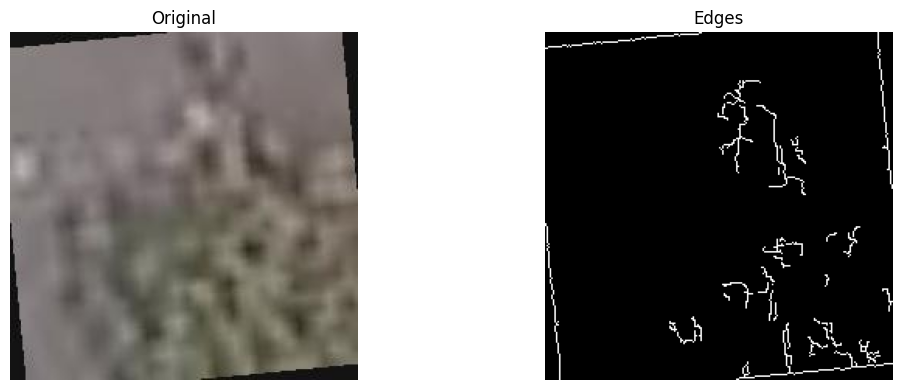

Label: 1, Lines: 3, edge_density13.28972018494898, Dominant direction:180.0


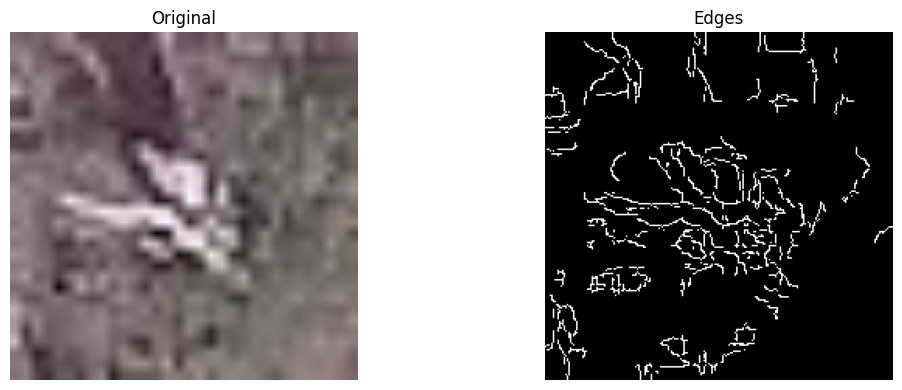

Label: 1, Lines: 14, edge_density17.604432397959183, Dominant direction:270.0


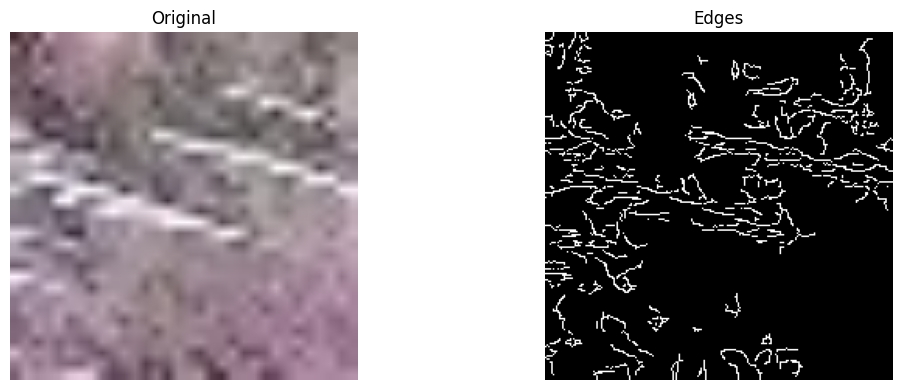

Label: 0, Lines: 4, edge_density7.374143016581633, Dominant direction:0.0


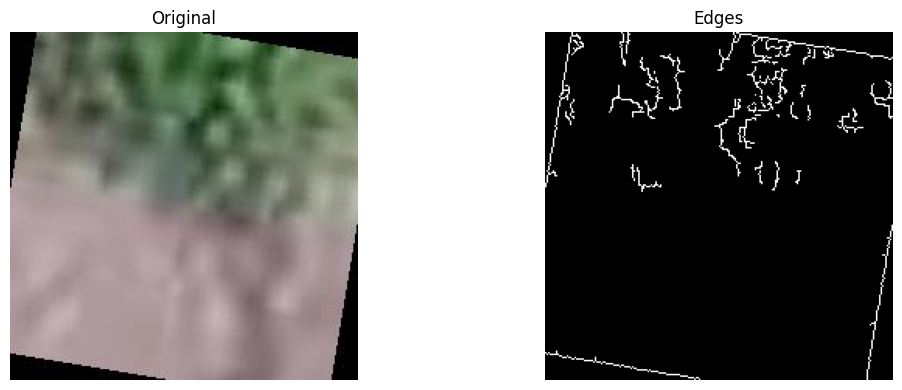

Label: 1, Lines: 4, edge_density8.319415656887756, Dominant direction:90.0


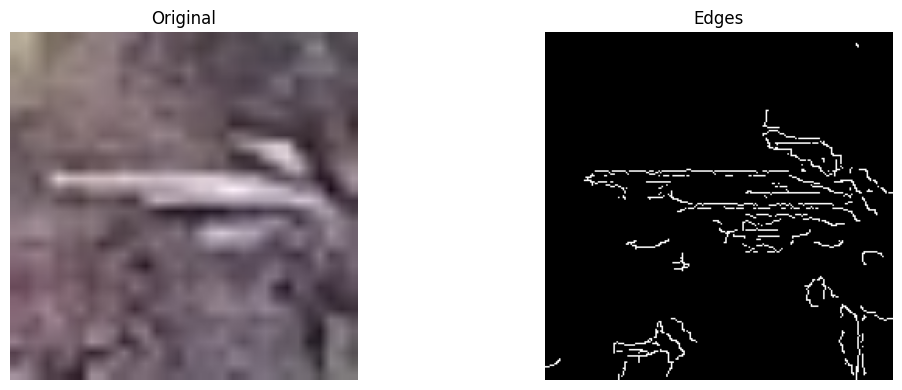

Label: 1, Lines: 17, edge_density16.59309231505102, Dominant direction:160.0


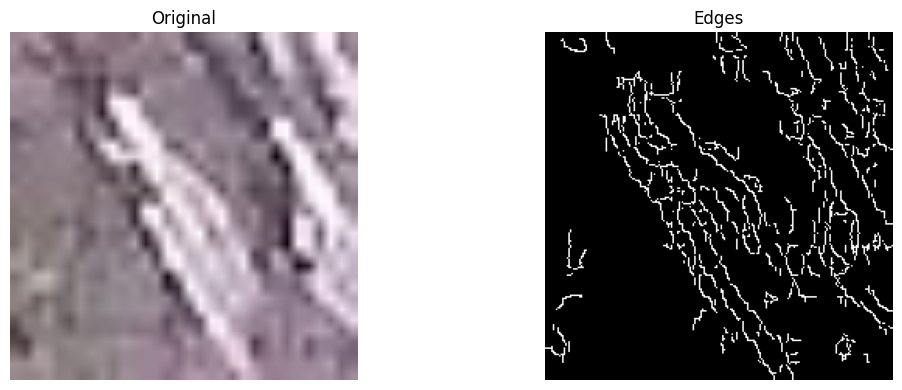

Label: 0, Lines: 4, edge_density11.65836256377551, Dominant direction:340.0


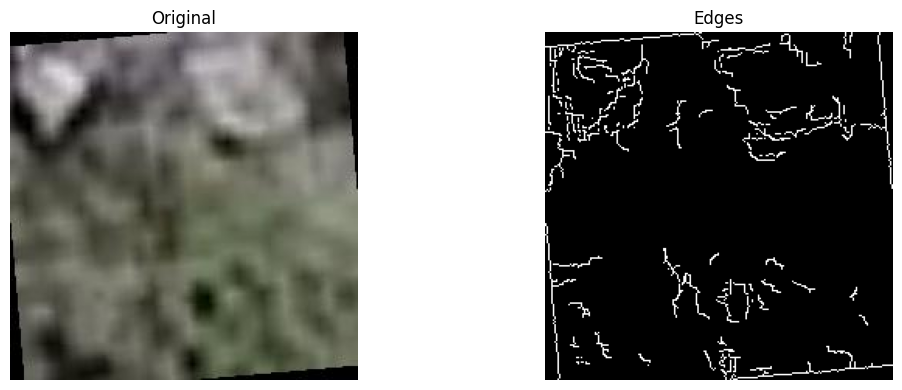

Label: 1, Lines: 0, edge_density3.2373046875, Dominant direction:90.0


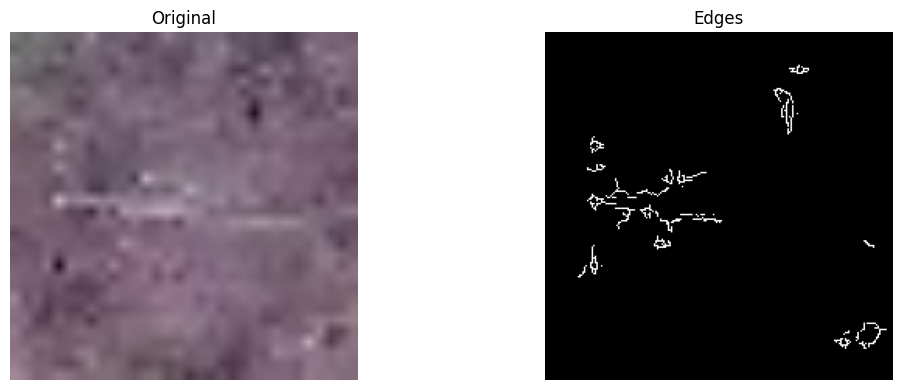

Label: 1, Lines: 4, edge_density9.035993303571429, Dominant direction:0.0


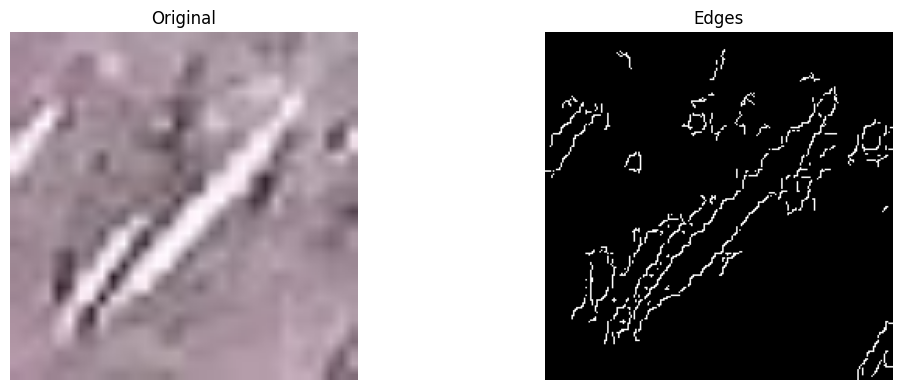

Label: 1, Lines: 26, edge_density12.63412786989796, Dominant direction:180.0


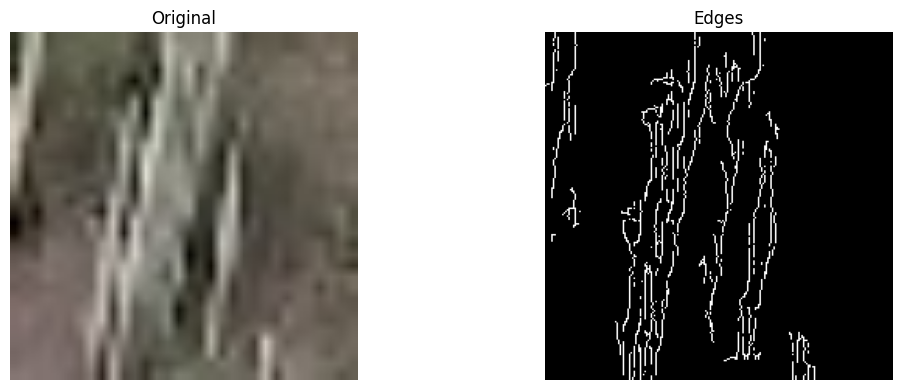

Label: 1, Lines: 8, edge_density7.546934789540816, Dominant direction:270.0


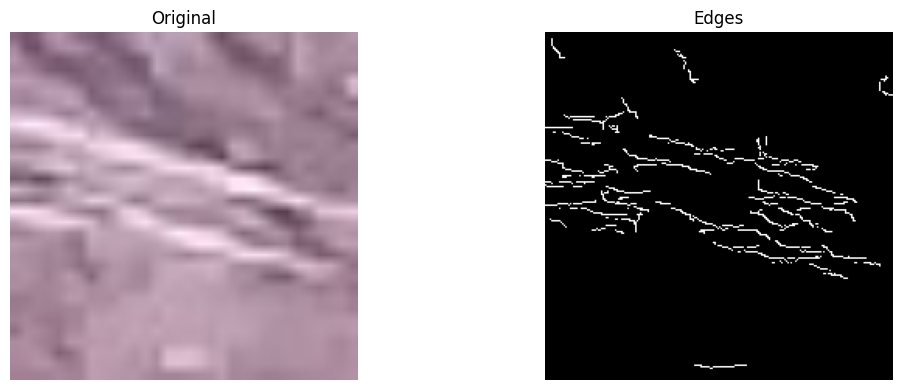

Label: 0, Lines: 6, edge_density12.90347975127551, Dominant direction:0.0


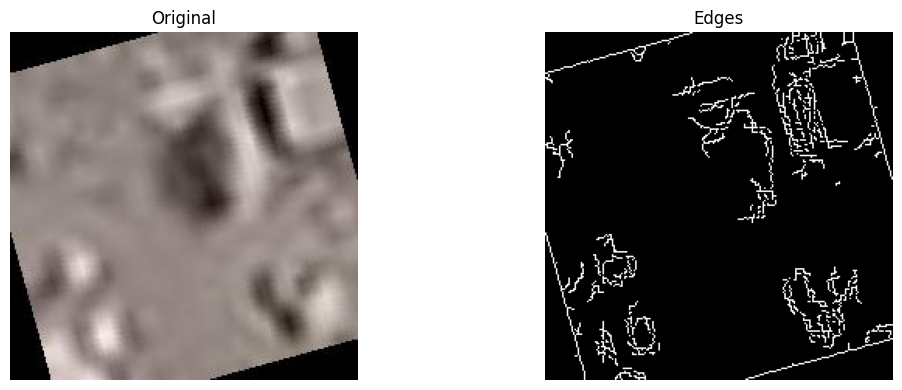

Label: 1, Lines: 0, edge_density0.5691964285714286, Dominant direction:0.0


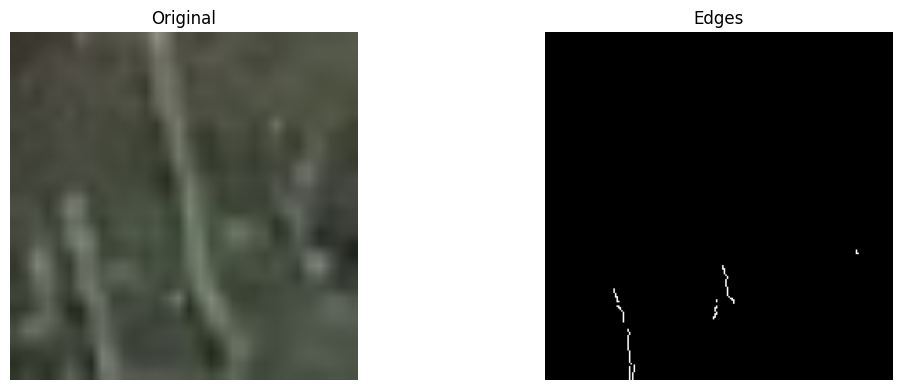

Label: 0, Lines: 4, edge_density4.091099330357143, Dominant direction:0.0


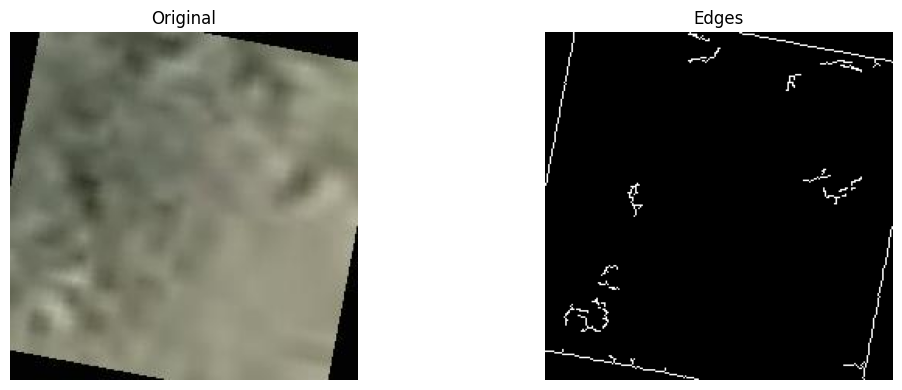

Label: 0, Lines: 4, edge_density2.5410554846938775, Dominant direction:0.0


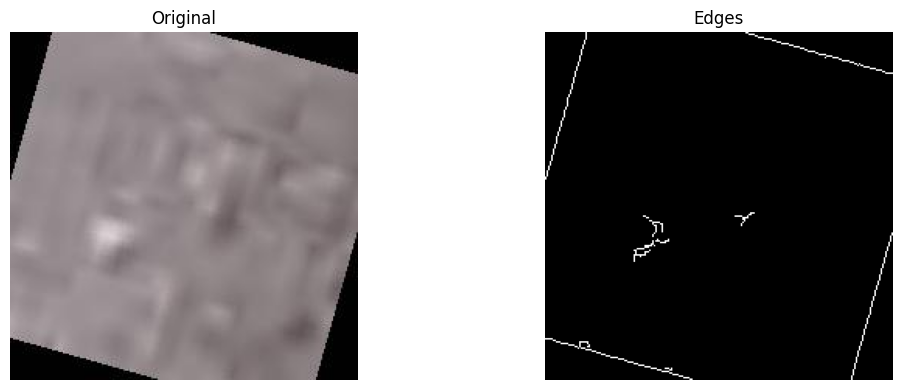

Label: 1, Lines: 4, edge_density8.64975286989796, Dominant direction:0.0


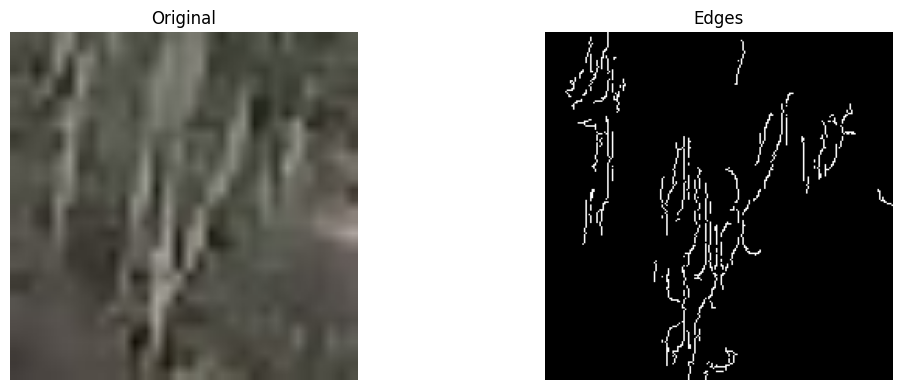

Label: 0, Lines: 4, edge_density7.247090242346939, Dominant direction:0.0


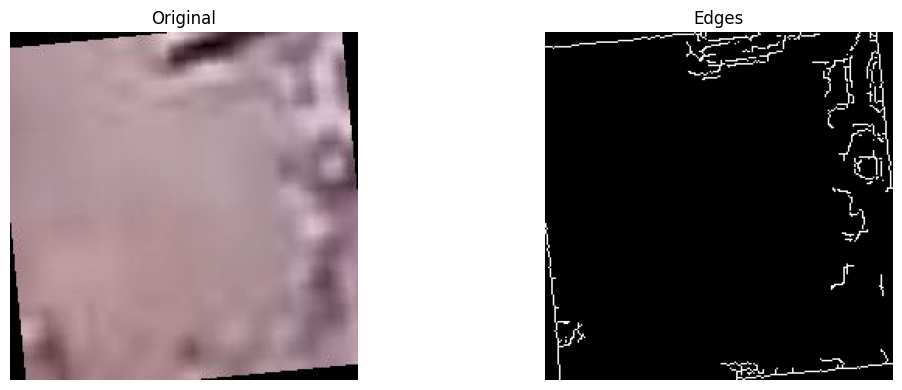

Label: 1, Lines: 0, edge_density2.515644929846939, Dominant direction:0.0


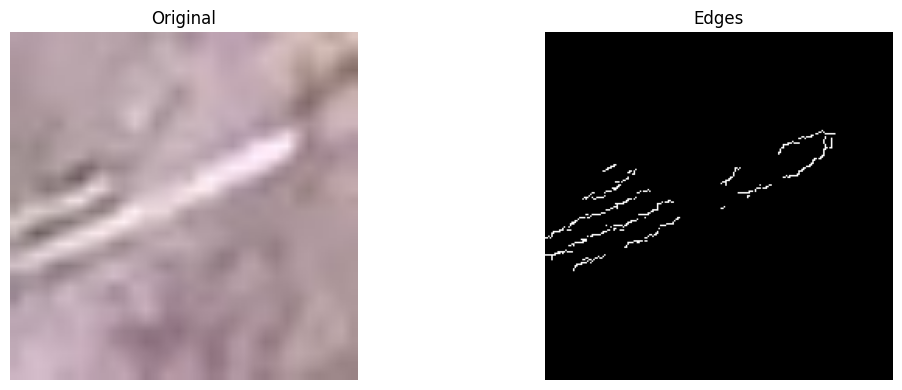

Label: 1, Lines: 1, edge_density5.280313297193878, Dominant direction:270.0


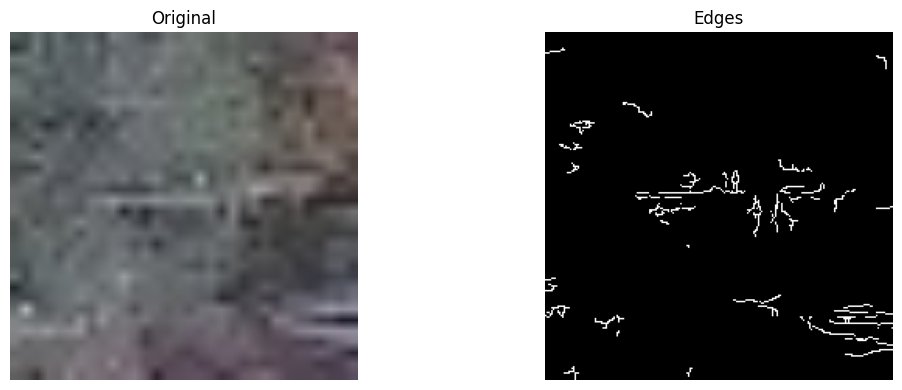

Label: 1, Lines: 0, edge_density6.484773596938775, Dominant direction:270.0


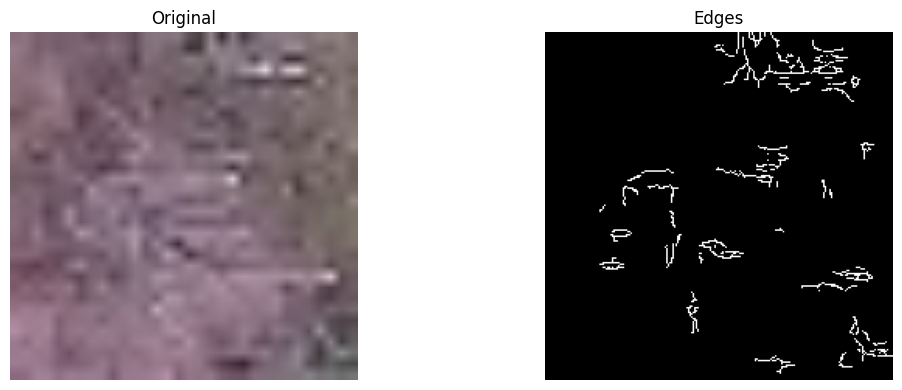

Label: 1, Lines: 3, edge_density8.675163424744898, Dominant direction:270.0


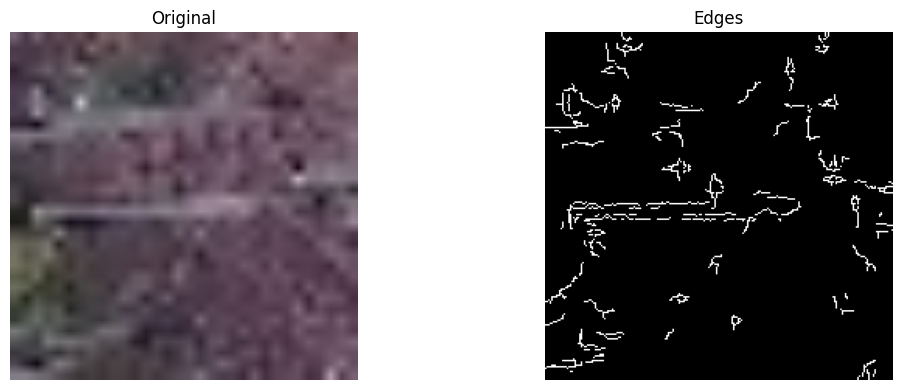

Label: 0, Lines: 0, edge_density0.39132254464285715, Dominant direction:0.0


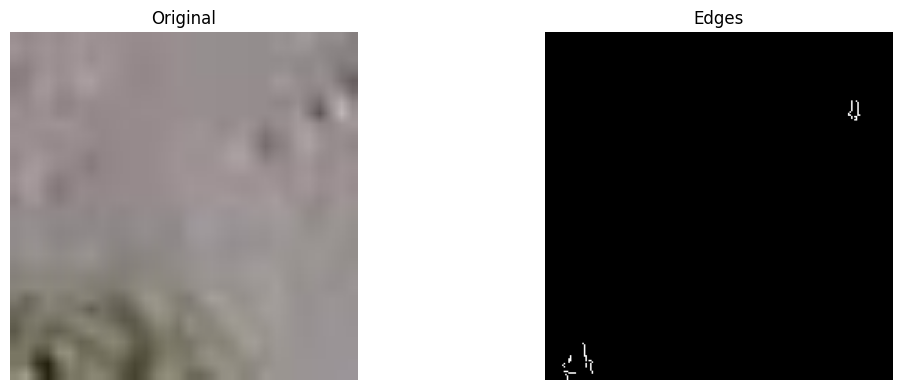

Label: 1, Lines: 0, edge_density3.3897680165816326, Dominant direction:270.0


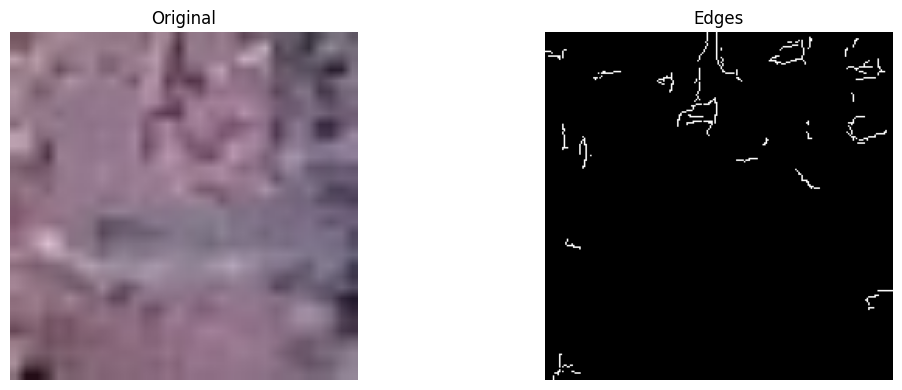

Label: 1, Lines: 10, edge_density15.434371014030612, Dominant direction:80.0


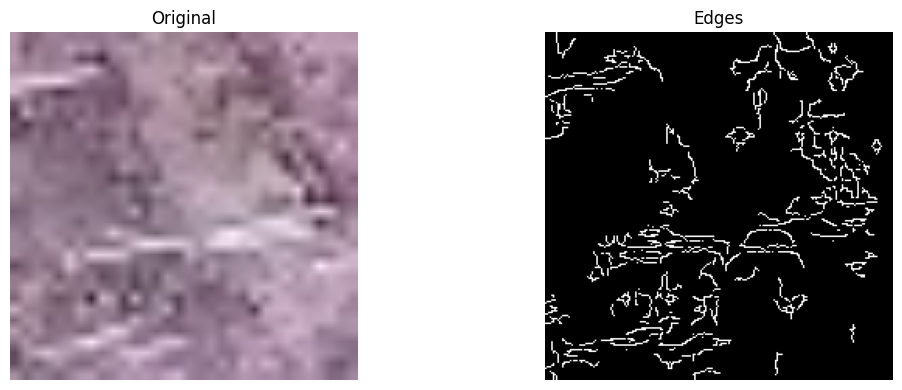

Label: 1, Lines: 3, edge_density6.962492028061225, Dominant direction:180.0


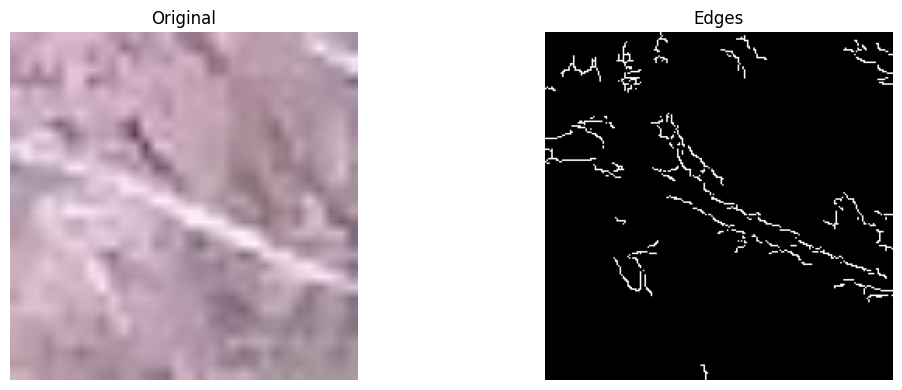

Label: 1, Lines: 12, edge_density13.269391741071429, Dominant direction:90.0


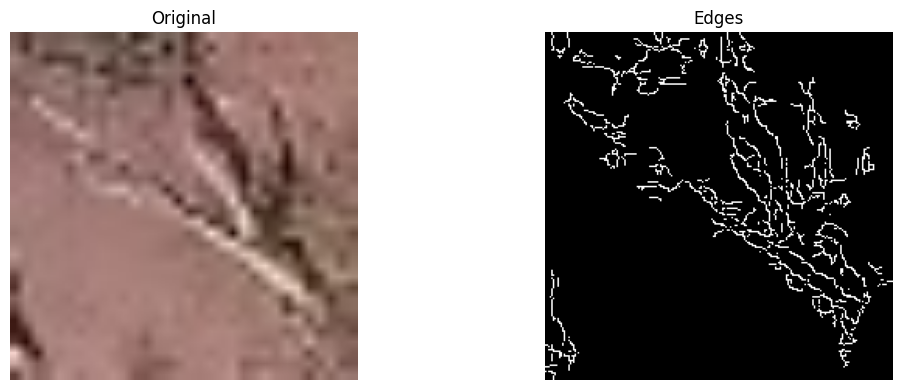

Label: 1, Lines: 1, edge_density5.956234056122449, Dominant direction:180.0


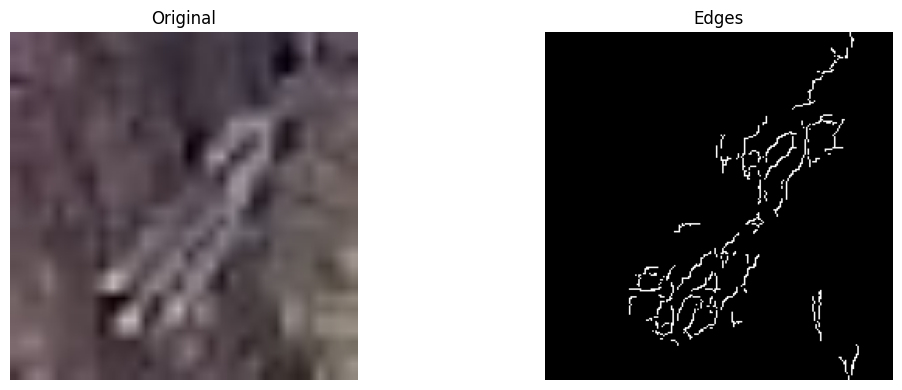

Label: 1, Lines: 7, edge_density15.037966358418368, Dominant direction:270.0


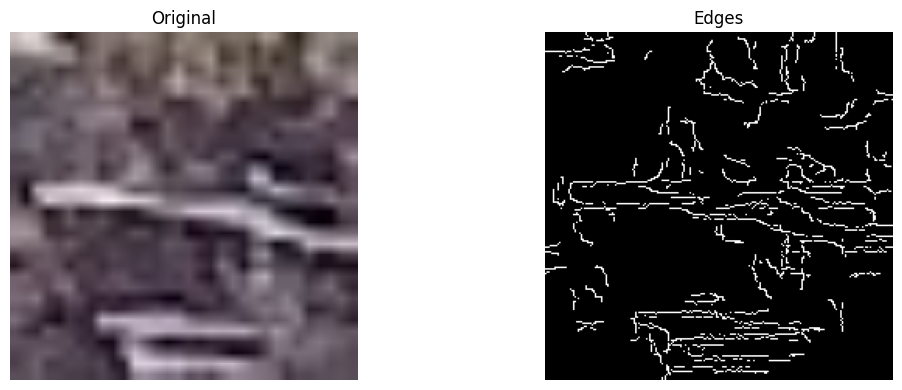

Label: 0, Lines: 4, edge_density3.089923469387755, Dominant direction:0.0


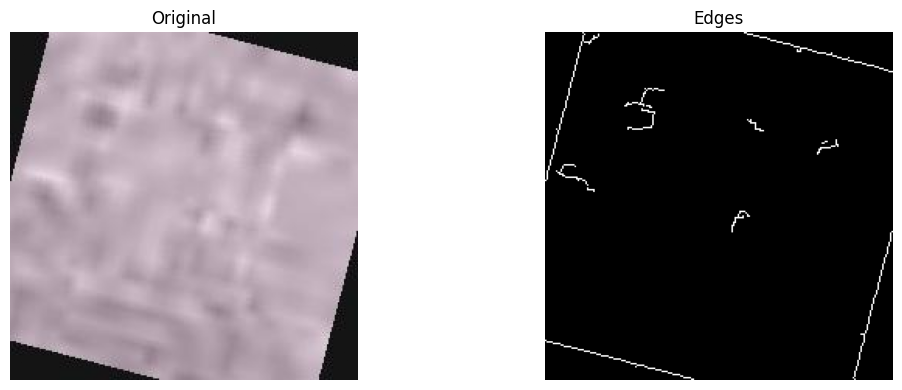

In [99]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

for i, (images, labels) in enumerate(training_dataloader):
    for img, label in zip(images, labels):
        img_np = img.permute(1, 2, 0).numpy()
        
        if img_np.shape[2] == 1:
            img_np = img_np.squeeze(-1)

        #Gray scale
        gray = cv2.cvtColor((img_np * 255).astype(np.uint8), cv2.COLOR_BGR2GRAY)
        #Bilateral Filter
        image = cv2.bilateralFilter(gray, d=3, sigmaColor=50, sigmaSpace=50)
        #Canny for edges
        edges = cv2.Canny(image, threshold1=20, threshold2=80) 
        #Compute edges density
        edge_density = np.sum(edges) / (edges.shape[0] * edges.shape[1])

        # Count lines in the edges image
        lines = cv2.HoughLinesP(edges, 1, np.pi/180, threshold=50, minLineLength=6, maxLineGap=5)
        num_lines = 0 if lines is None else len(lines)

        # Compute direction of edges by Sobel
        gradient_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=5)
        gradient_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=5)
        
        magnitude, direction = cv2.cartToPolar(gradient_x, gradient_y, angleInDegrees=True)
        
        # For find dominat direction
        hist, bins = np.histogram(direction, bins=36, range=(0, 360))
        dominant_angles = bins[np.argmax(hist)]
        
        print(f"Label: {label}, Lines: {num_lines}, Edge density: {edge_density}, Dominant direction:{dominant_angles}")

        plt.figure(figsize=(12, 4))
        plt.subplot(1, 2, 1)
        plt.title("Original")
        plt.imshow(img_np)
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.title("Edges")
        plt.imshow(edges, cmap='gray')
        plt.axis('off')

        plt.tight_layout()
        plt.show()

    break

Label: 1, Total lines: 166, V: 48, H: 54, O: 64


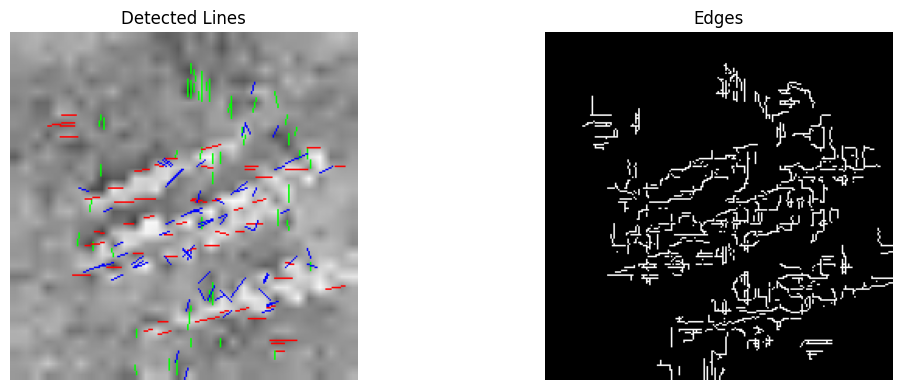

Label: 1, Total lines: 51, V: 15, H: 17, O: 19


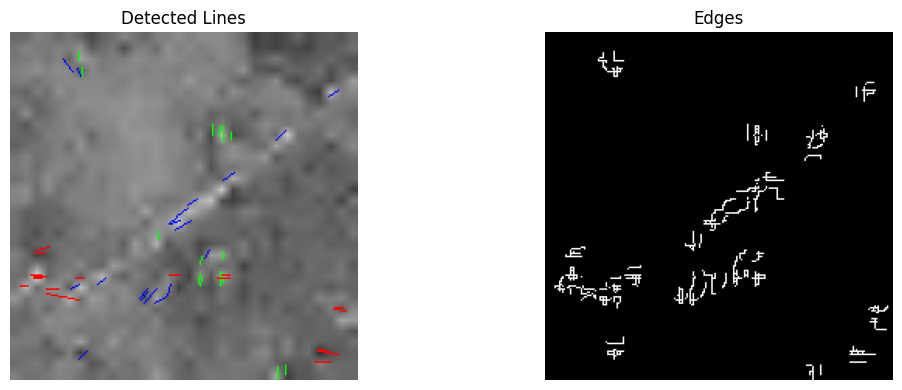

Label: 1, Total lines: 94, V: 36, H: 17, O: 41


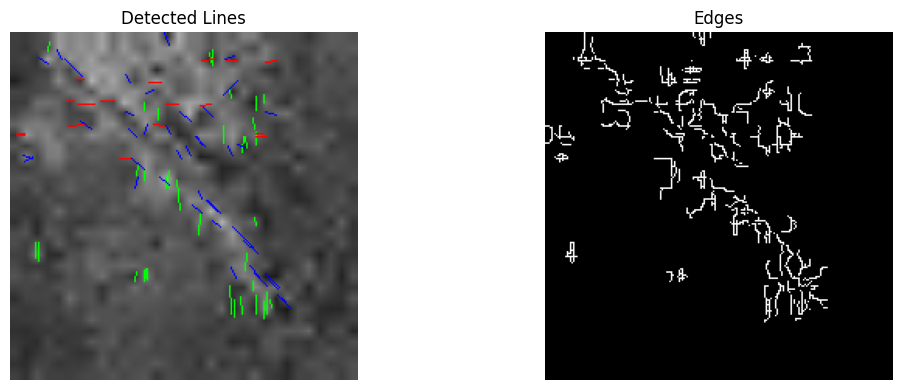

Label: 1, Total lines: 87, V: 25, H: 22, O: 40


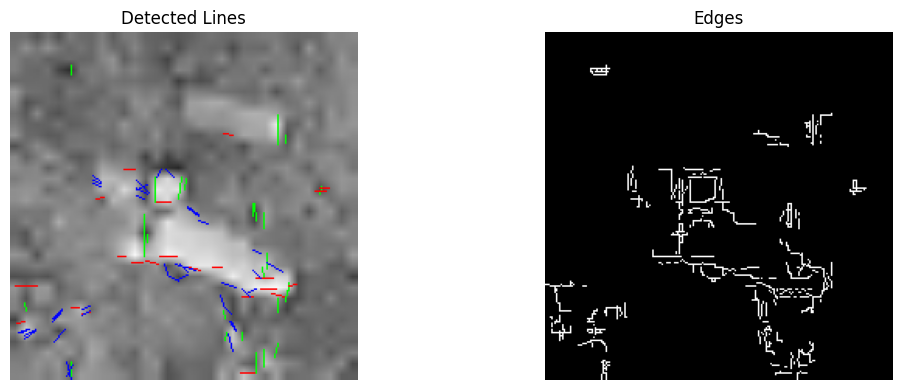

Label: 0, Total lines: 0, V: 0, H: 0, O: 0


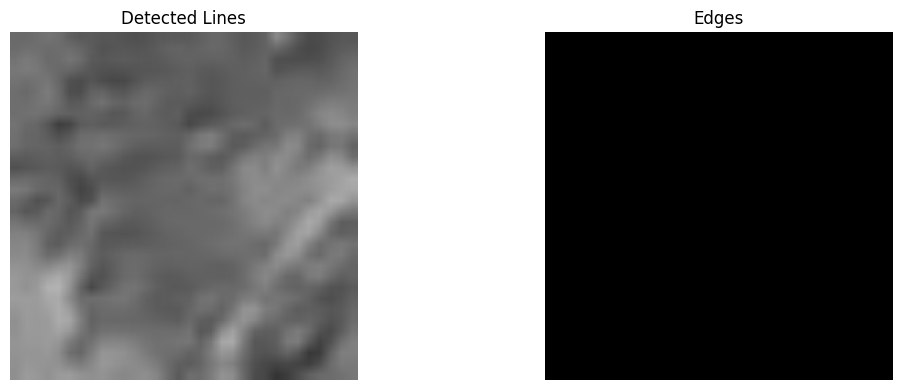

Label: 0, Total lines: 4, V: 4, H: 0, O: 0


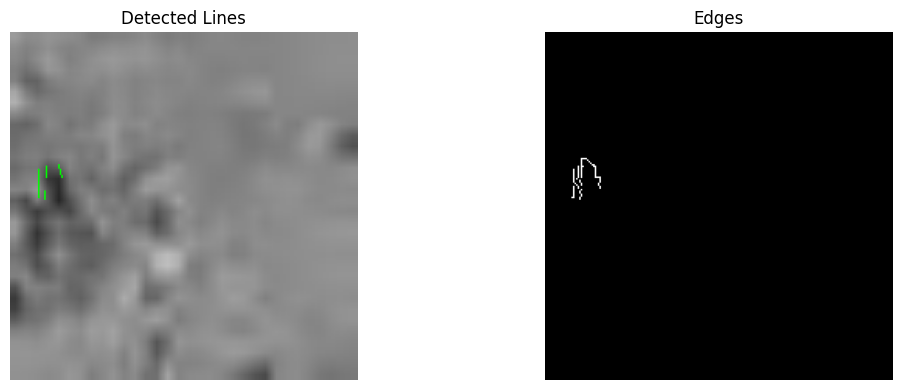

Label: 0, Total lines: 32, V: 12, H: 15, O: 5


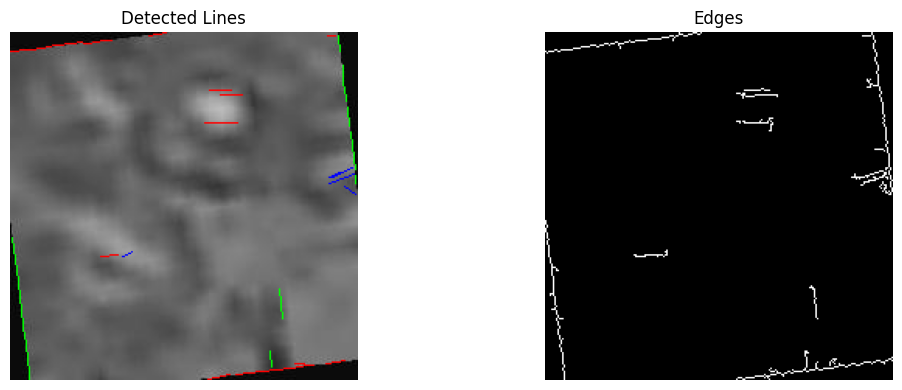

Label: 0, Total lines: 23, V: 6, H: 4, O: 13


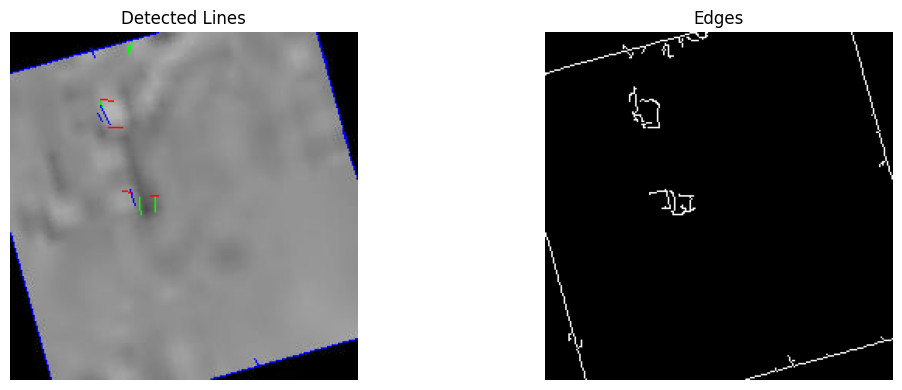

Label: 1, Total lines: 16, V: 1, H: 14, O: 1


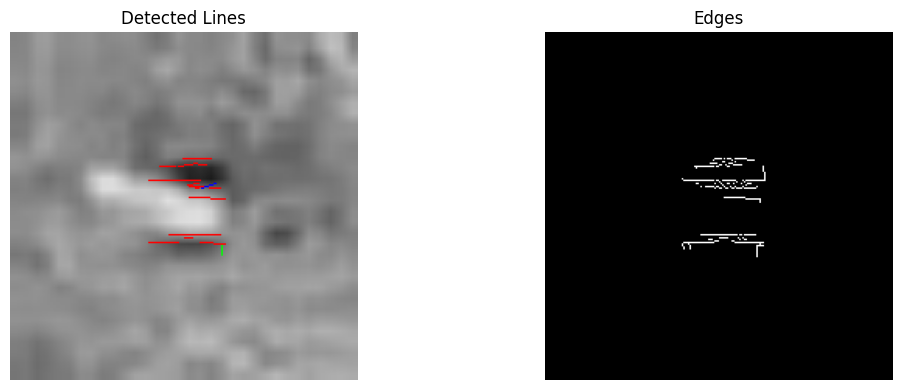

Label: 0, Total lines: 81, V: 40, H: 26, O: 15


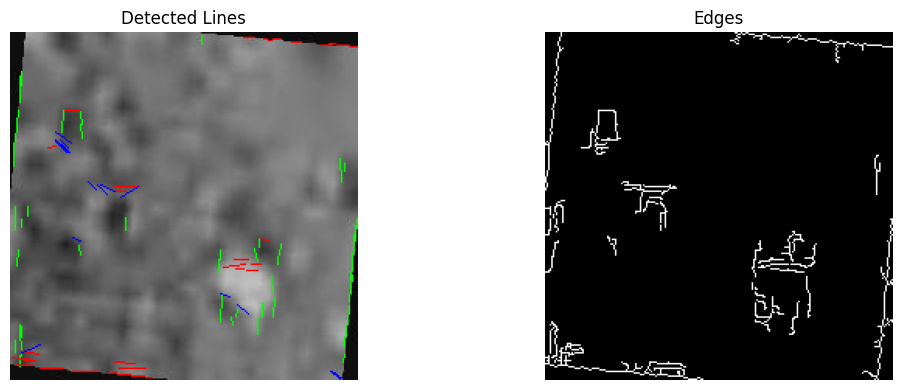

Label: 0, Total lines: 44, V: 18, H: 23, O: 3


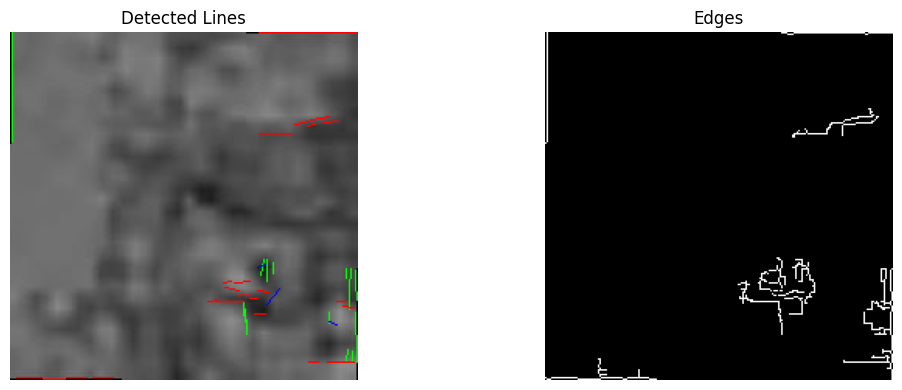

Label: 0, Total lines: 2, V: 2, H: 0, O: 0


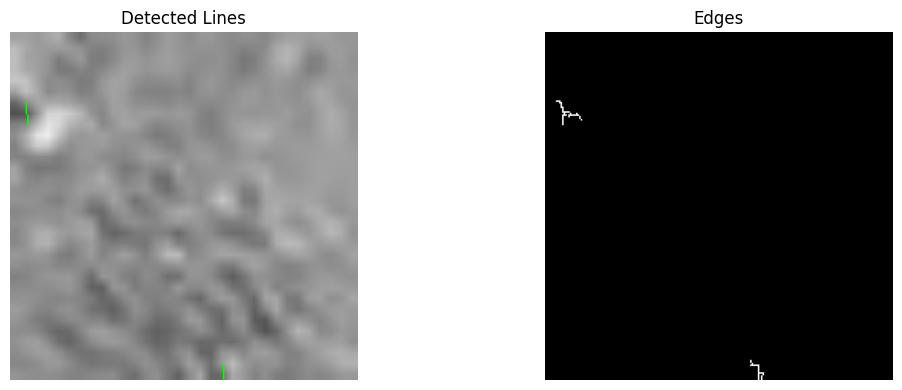

Label: 1, Total lines: 51, V: 23, H: 9, O: 19


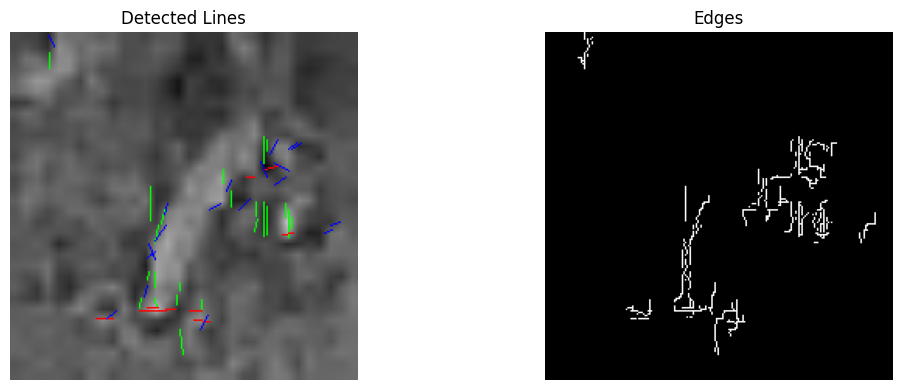

Label: 1, Total lines: 54, V: 18, H: 15, O: 21


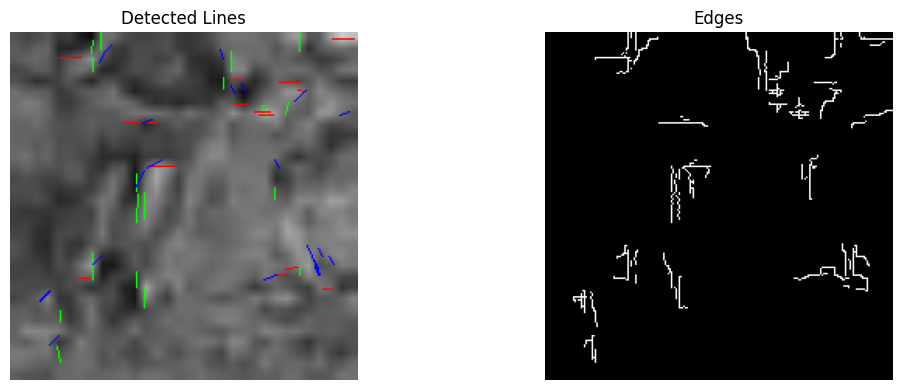

Label: 1, Total lines: 112, V: 7, H: 38, O: 67


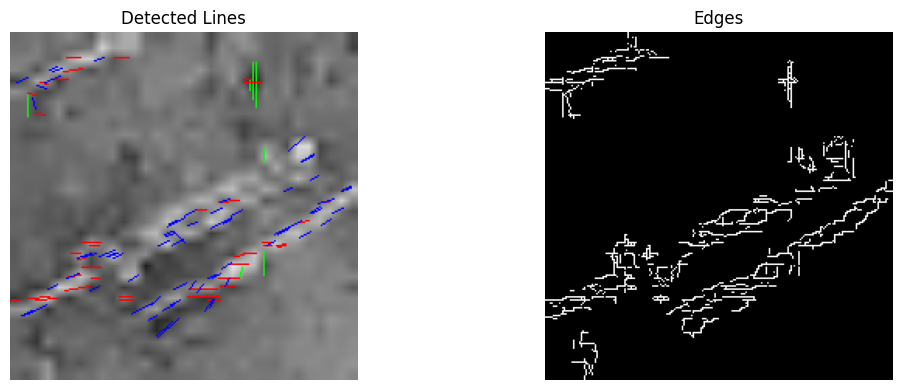

Label: 0, Total lines: 141, V: 24, H: 18, O: 99


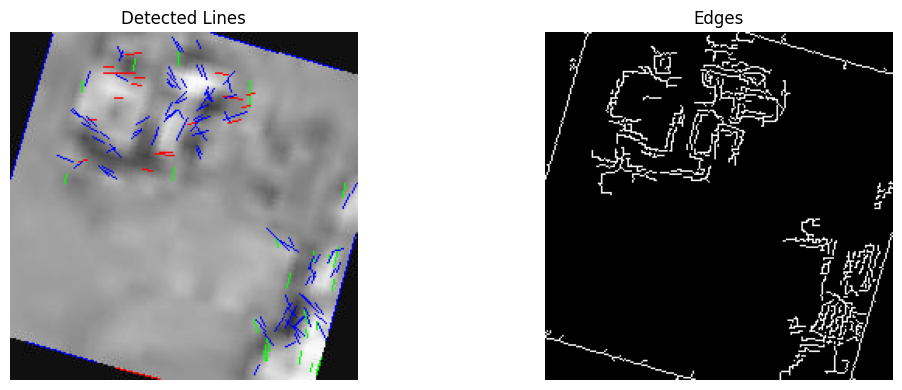

Label: 0, Total lines: 53, V: 20, H: 29, O: 4


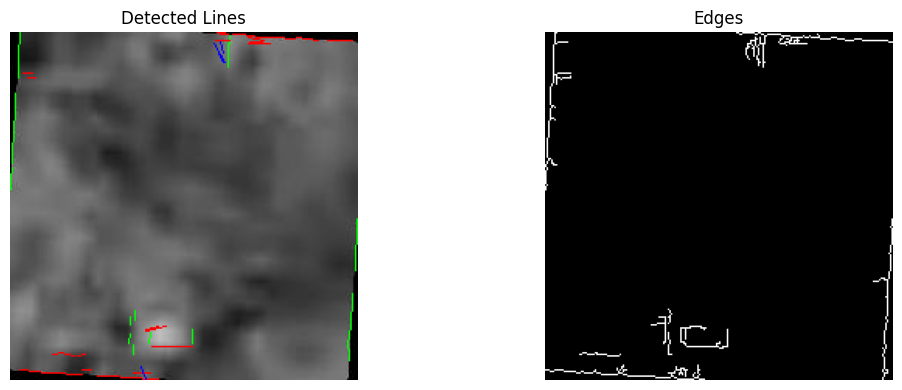

Label: 1, Total lines: 75, V: 27, H: 18, O: 30


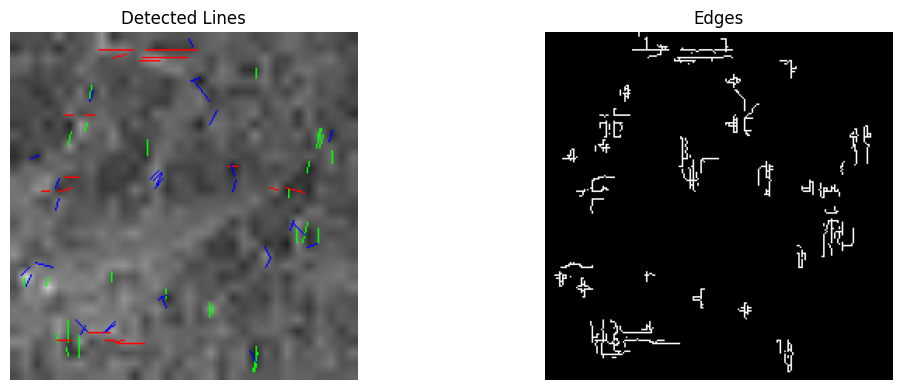

Label: 1, Total lines: 64, V: 15, H: 33, O: 16


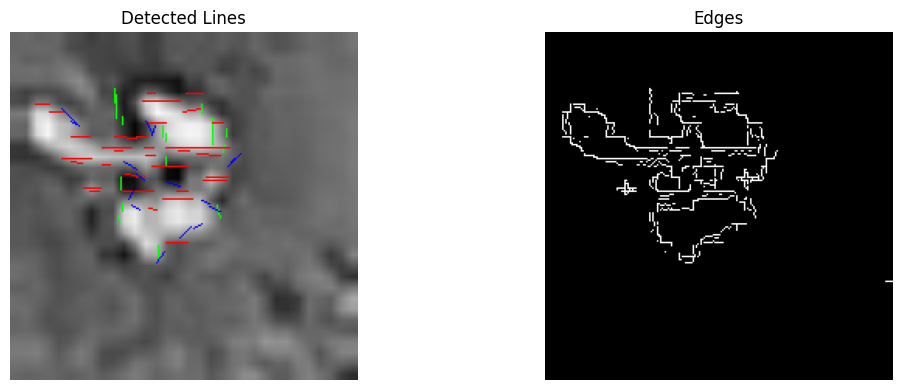

Label: 1, Total lines: 126, V: 119, H: 0, O: 7


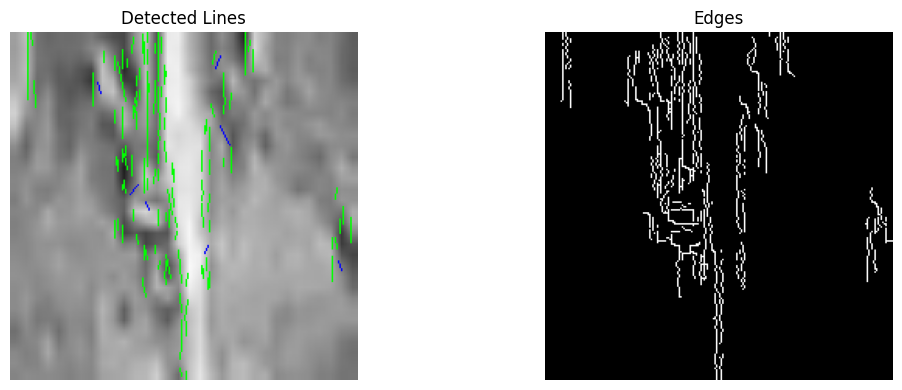

Label: 0, Total lines: 44, V: 20, H: 21, O: 3


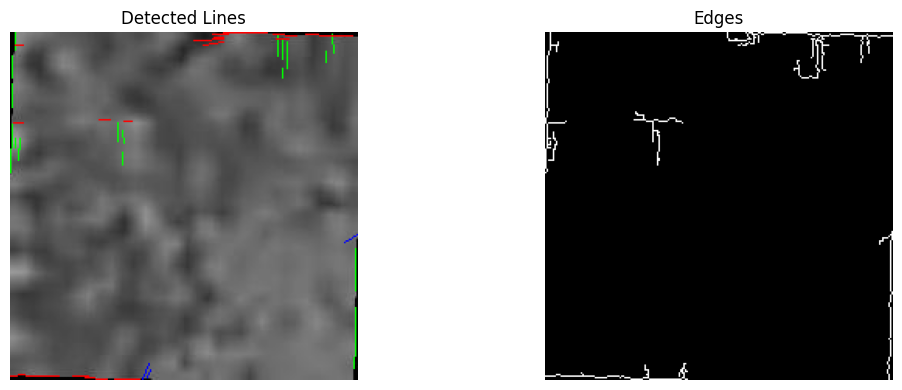

Label: 0, Total lines: 174, V: 53, H: 69, O: 52


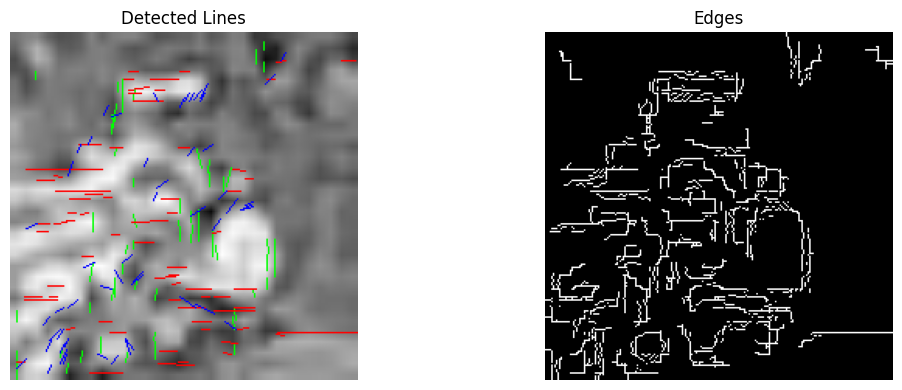

Label: 0, Total lines: 39, V: 20, H: 16, O: 3


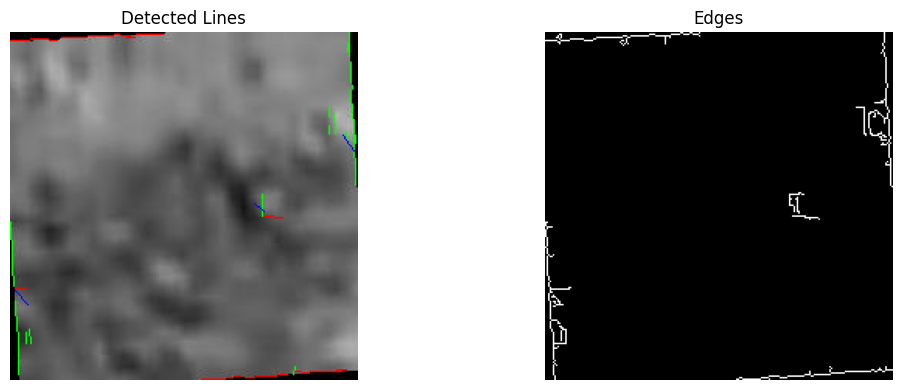

Label: 1, Total lines: 63, V: 61, H: 0, O: 2


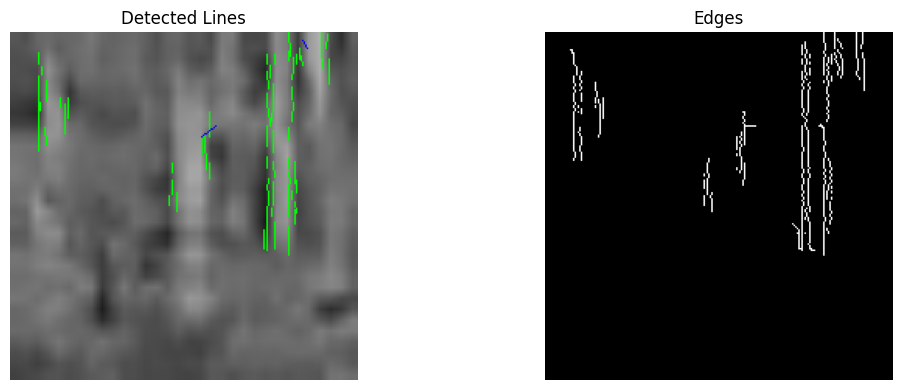

Label: 1, Total lines: 120, V: 39, H: 23, O: 58


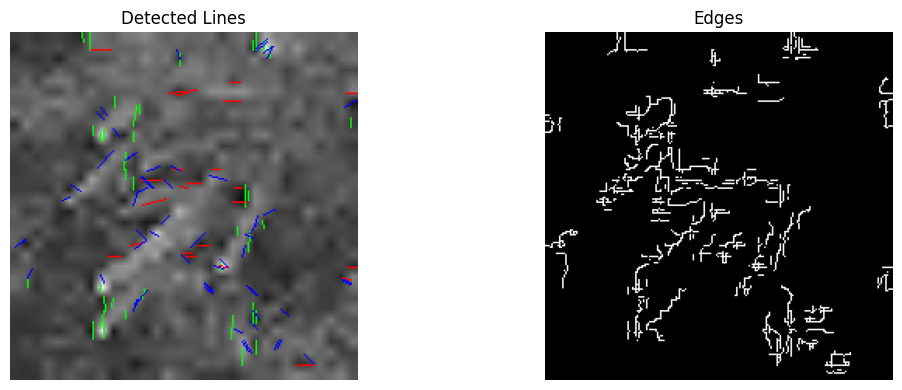

Label: 0, Total lines: 12, V: 3, H: 1, O: 8


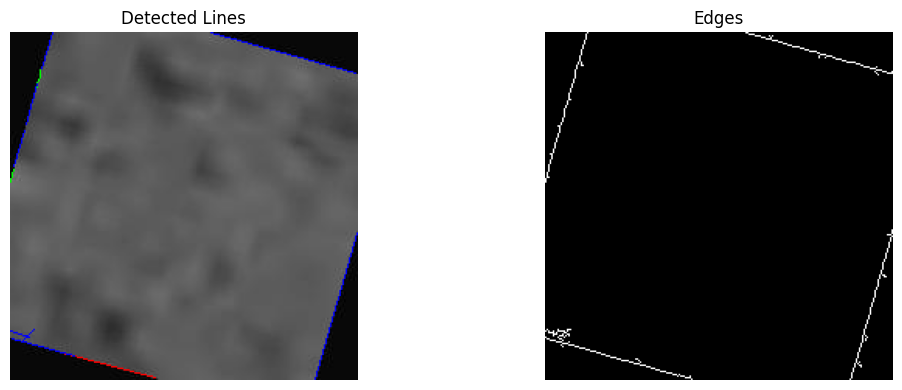

Label: 0, Total lines: 0, V: 0, H: 0, O: 0


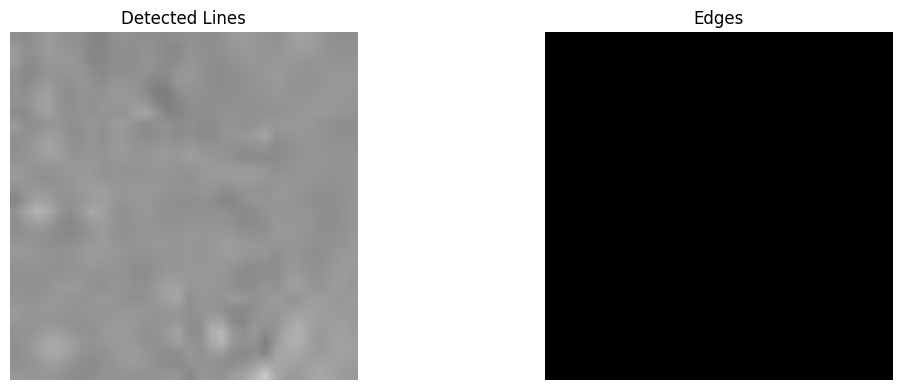

Label: 0, Total lines: 39, V: 18, H: 20, O: 1


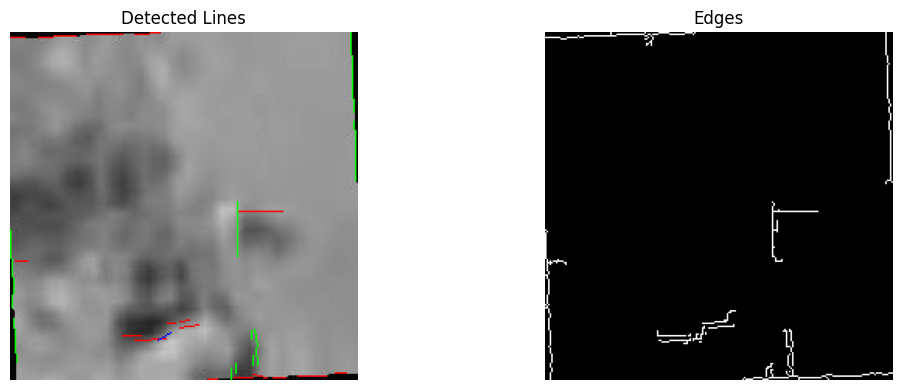

Label: 1, Total lines: 94, V: 60, H: 21, O: 13


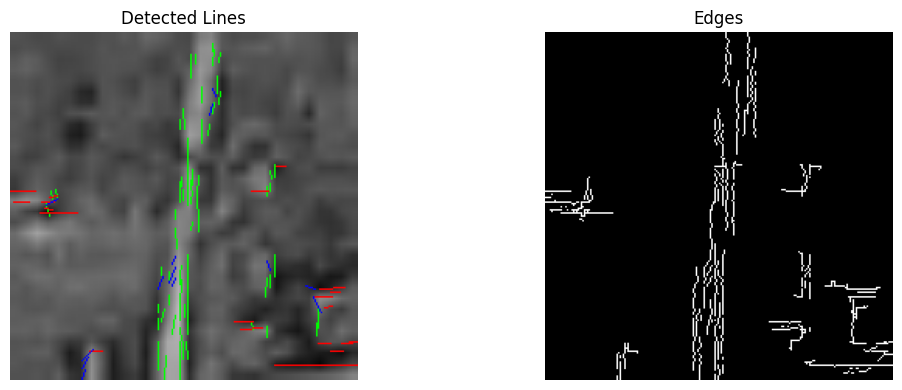

Label: 1, Total lines: 26, V: 13, H: 3, O: 10


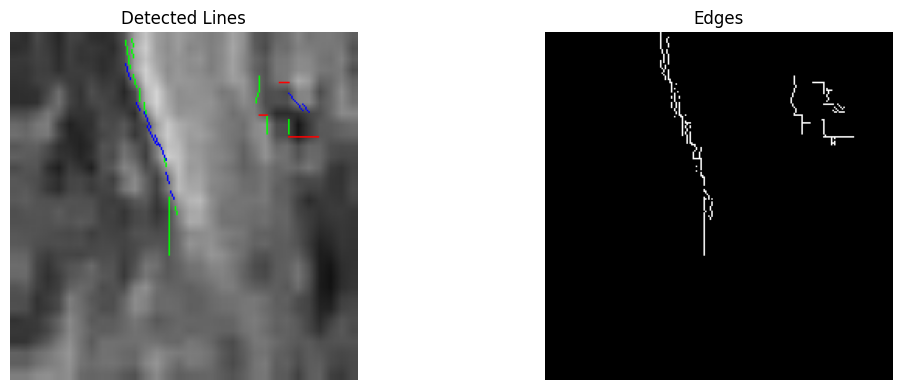

Label: 0, Total lines: 49, V: 14, H: 19, O: 16


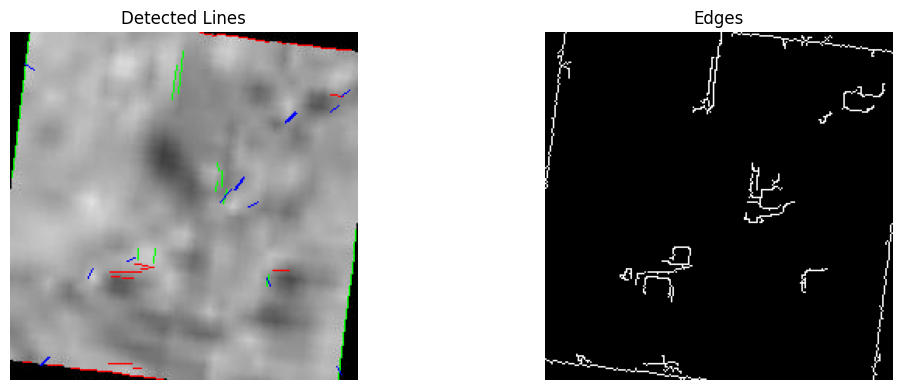

Label: 0, Total lines: 162, V: 65, H: 43, O: 54


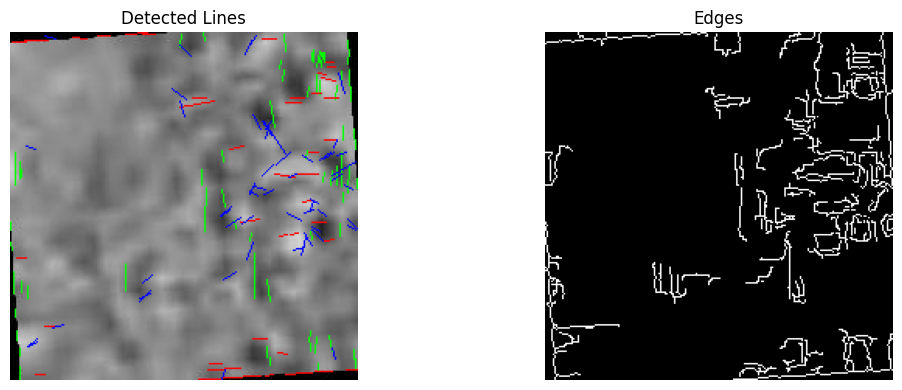

In [120]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def find_lines(edges):
    lines = cv2.HoughLinesP(edges, 1, np.pi / 180, threshold=10, minLineLength=5, maxLineGap=2)
    return lines

def filter_lines(lines):
    vertical = []
    horizontal = []
    oblique = []
    
    if lines is None:
        return vertical, horizontal, oblique
    
    for line in lines:
        x1, y1, x2, y2 = line[0]
        angle = np.arctan2((y2 - y1), (x2 - x1)) * 180 / np.pi
        if abs(angle) < 15:
            horizontal.append((x1, y1, x2, y2))
        elif abs(abs(angle) - 90) < 15:
            vertical.append((x1, y1, x2, y2))
        else:
            oblique.append((x1, y1, x2, y2))
    return vertical, horizontal, oblique

def draw_lines(img_gray, vertical, horizontal, oblique):
    img_color = cv2.cvtColor(img_gray, cv2.COLOR_GRAY2BGR)
    
    for x1, y1, x2, y2 in vertical:
        cv2.line(img_color, (x1, y1), (x2, y2), (0, 255, 0), 1)  # g
    for x1, y1, x2, y2 in horizontal:
        cv2.line(img_color, (x1, y1), (x2, y2), (255, 0, 0), 1)  # b
    for x1, y1, x2, y2 in oblique:
        cv2.line(img_color, (x1, y1), (x2, y2), (0, 0, 255), 1)  # r

    return img_color

for i, (images, labels) in enumerate(training_dataloader):
    for img, label in zip(images, labels):
        # Convert to numpy array and handle grayscale
        img_np = img.permute(1, 2, 0).numpy()
        if img_np.shape[2] == 1:
            img_np = img_np.squeeze(-1)

        # Convert to grayscale
        if img_np.ndim == 3 and img_np.shape[2] == 3:
            gray = cv2.cvtColor((img_np * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
        else:
            gray = (img_np * 255).astype(np.uint8)

        # Apply Canny edge detection
        edges = cv2.Canny(gray, threshold1=30, threshold2=100, L2gradient =True )

        # Find and classify lines
        lines = find_lines(edges)
        vertical, horizontal, oblique = filter_lines(lines)
        num_lines = len(vertical) + len(horizontal) + len(oblique)

        # Draw them
        img_with_lines = draw_lines(gray, vertical, horizontal, oblique)

        print(f"Label: {label}, Total lines: {num_lines}, V: {len(vertical)}, H: {len(horizontal)}, O: {len(oblique)}")

        # Visualization
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 2, 1)
        plt.title("Detected Lines")
        plt.imshow(img_with_lines)
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.title("Edges")
        plt.imshow(edges, cmap='gray')
        plt.axis('off')

        plt.tight_layout()
        plt.show()

    break


In [123]:
import numpy as np
import torch
import cv2

def compute_edge_features(img_tensor, use_sobel=False):
    """
    Args:
        img_tensor (torch.Tensor): img (3, 32, 32), normalized values [0,1]
        use_sobel (bool): if True, add Sobel

    Returns:
        np.ndarray: array (32, 32, N_feature)
    """
    img = img_tensor.numpy()
    channels = []

    for c in range(3):  # R, G, B
        channel = img[c]

        dx = np.zeros_like(channel)
        dx[:, :-1] = channel[:, :-1] - channel[:, 1:]

        dy = np.zeros_like(channel)
        dy[:-1, :] = channel[:-1, :] - channel[1:, :]

        d_diag1 = np.zeros_like(channel)
        d_diag1[:-1, :-1] = channel[:-1, :-1] - channel[1:, 1:]

        d_diag2 = np.zeros_like(channel)
        d_diag2[:-1, 1:] = channel[:-1, 1:] - channel[1:, :-1]

        channels.extend([dx, dy, d_diag1, d_diag2])

        # Sobel 
        if use_sobel:
            channel_uint8 = (channel * 255).astype(np.uint8)
            sobelx = cv2.Sobel(channel_uint8, cv2.CV_64F, 1, 0, ksize=3)
            sobely = cv2.Sobel(channel_uint8, cv2.CV_64F, 0, 1, ksize=3)
            magnitude = np.sqrt(sobelx ** 2 + sobely ** 2)
            channels.append(magnitude / magnitude.max())  # on [0, 1]

    return np.stack(channels, axis=-1) 

Label: 0, Edge shape: (224, 224, 15)


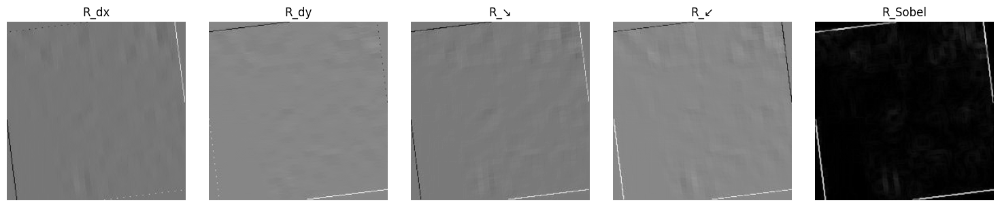

Label: 1, Edge shape: (224, 224, 15)


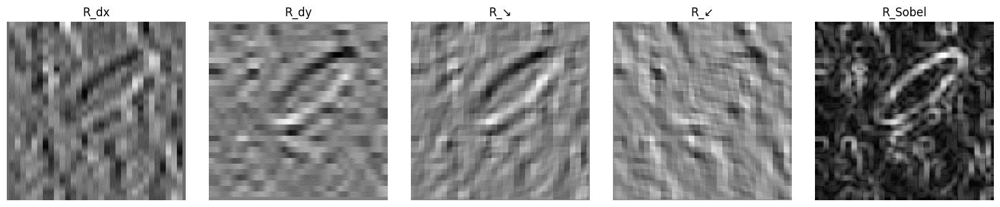

Label: 0, Edge shape: (224, 224, 15)


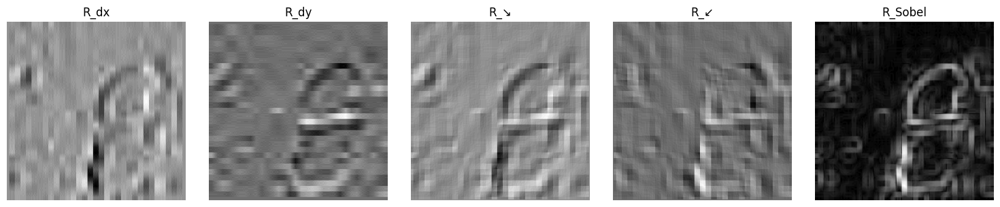

Label: 0, Edge shape: (224, 224, 15)


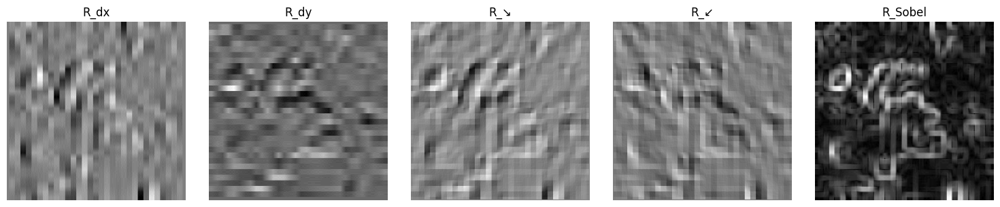

Label: 1, Edge shape: (224, 224, 15)


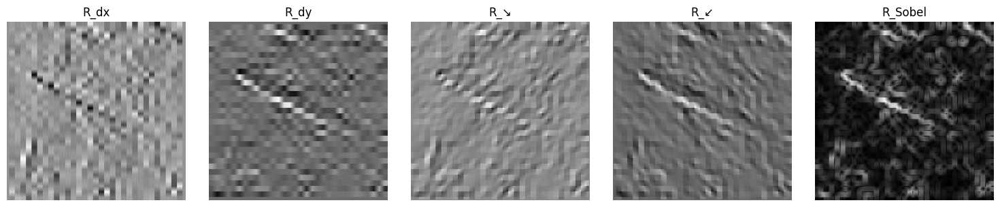

Label: 1, Edge shape: (224, 224, 15)


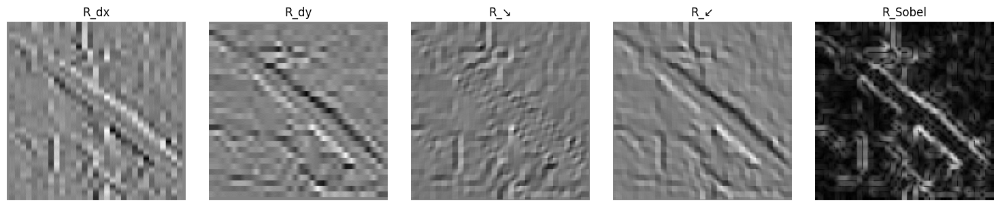

Label: 1, Edge shape: (224, 224, 15)


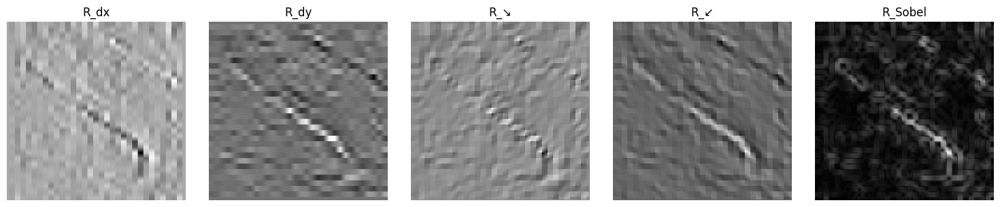

Label: 0, Edge shape: (224, 224, 15)


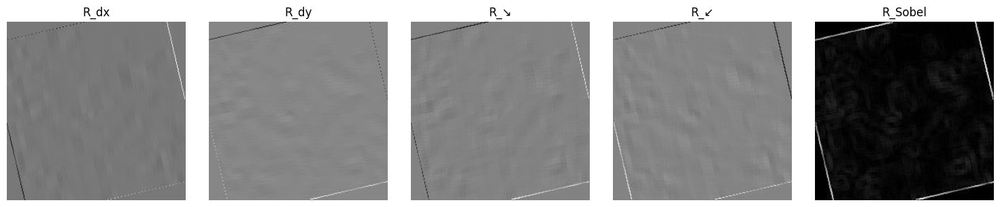

Label: 0, Edge shape: (224, 224, 15)


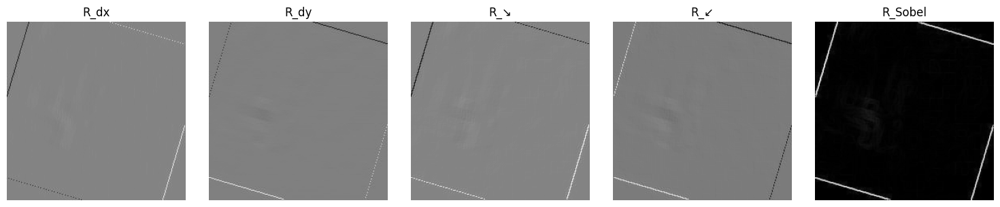

Label: 0, Edge shape: (224, 224, 15)


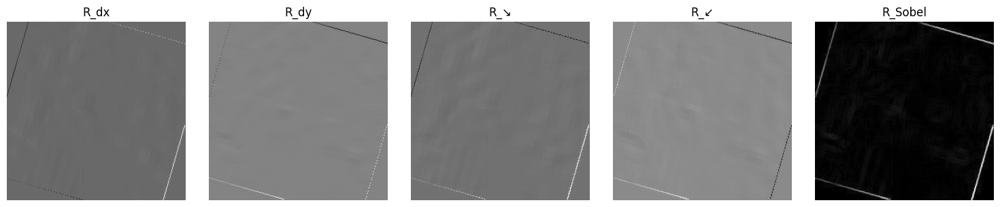

Label: 1, Edge shape: (224, 224, 15)


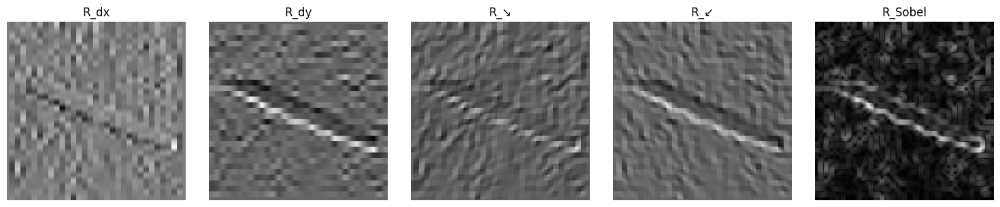

Label: 1, Edge shape: (224, 224, 15)


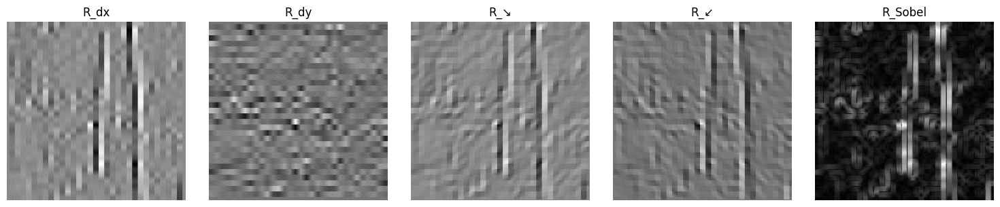

Label: 1, Edge shape: (224, 224, 15)


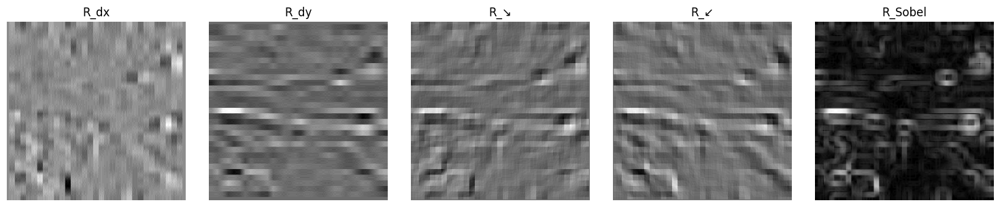

Label: 0, Edge shape: (224, 224, 15)


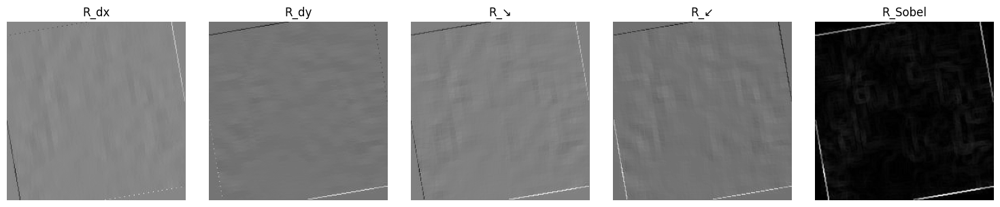

Label: 1, Edge shape: (224, 224, 15)


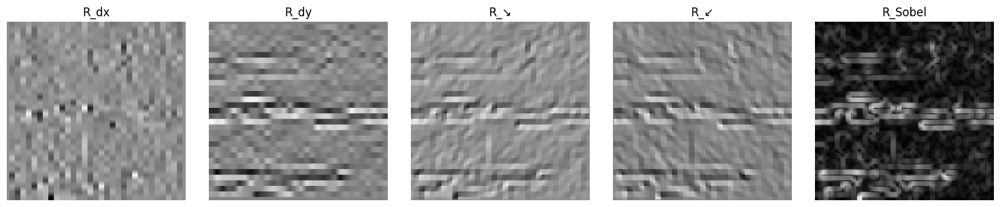

Label: 1, Edge shape: (224, 224, 15)


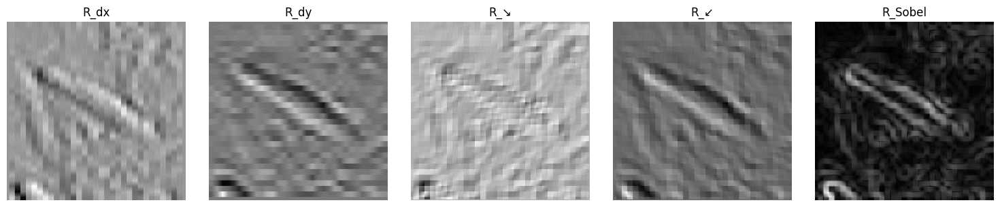

Label: 1, Edge shape: (224, 224, 15)


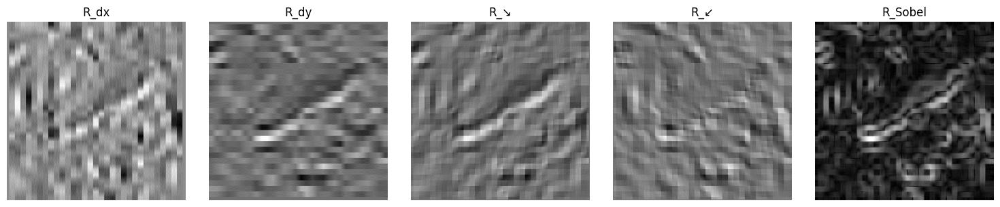

Label: 0, Edge shape: (224, 224, 15)


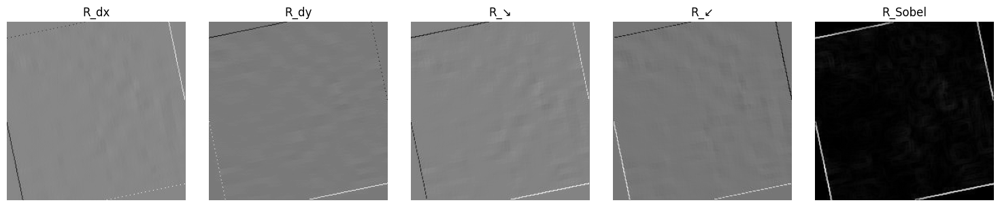

Label: 0, Edge shape: (224, 224, 15)


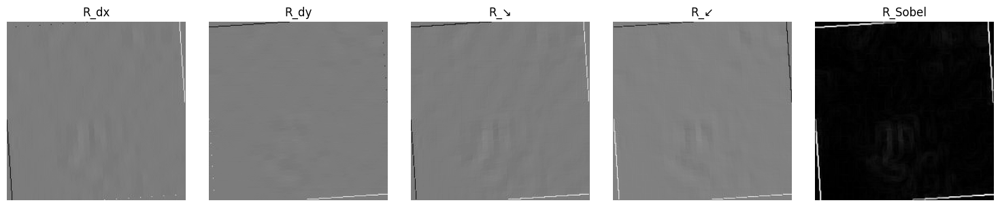

Label: 0, Edge shape: (224, 224, 15)


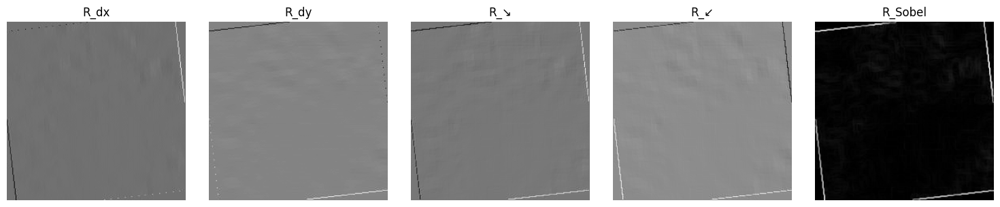

Label: 1, Edge shape: (224, 224, 15)


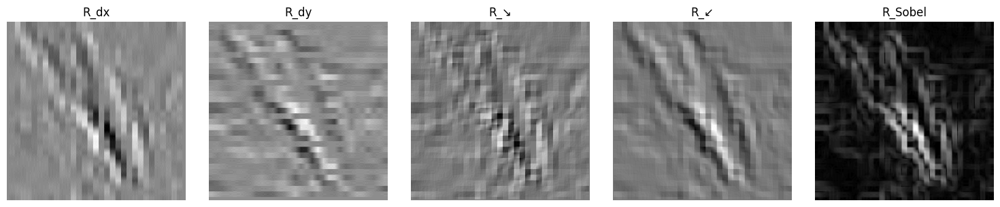

Label: 1, Edge shape: (224, 224, 15)


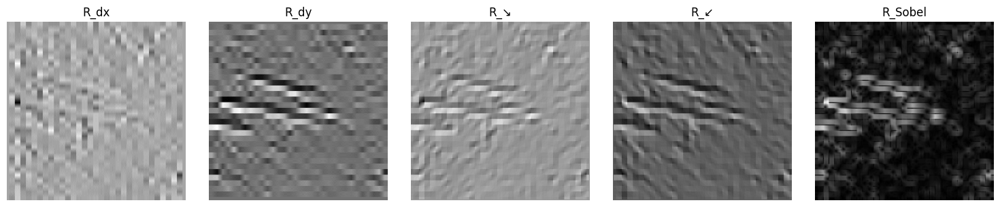

Label: 1, Edge shape: (224, 224, 15)


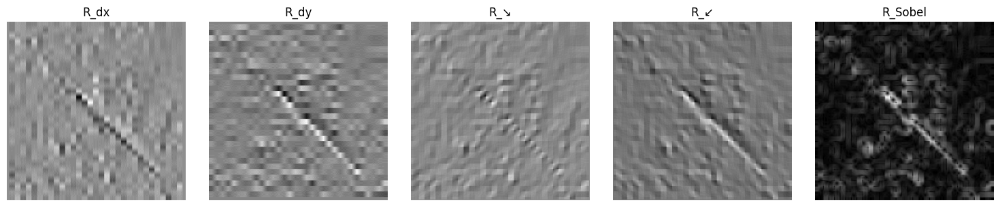

Label: 1, Edge shape: (224, 224, 15)


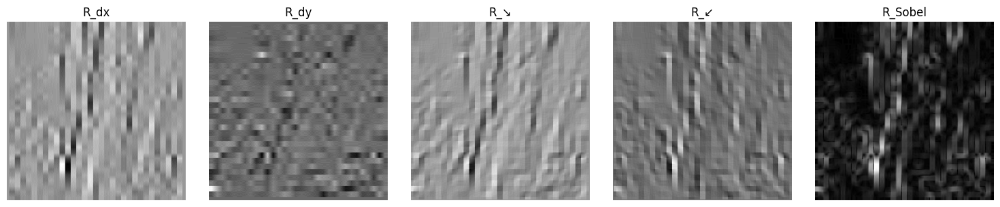

Label: 1, Edge shape: (224, 224, 15)


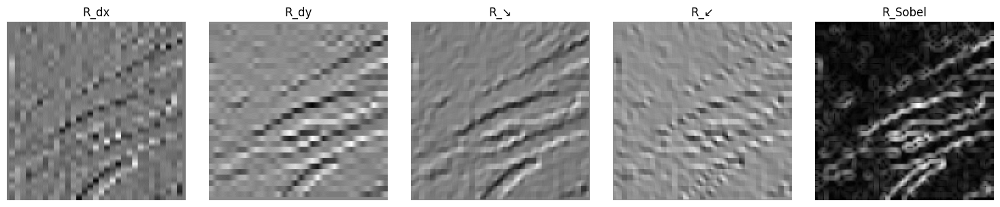

Label: 0, Edge shape: (224, 224, 15)


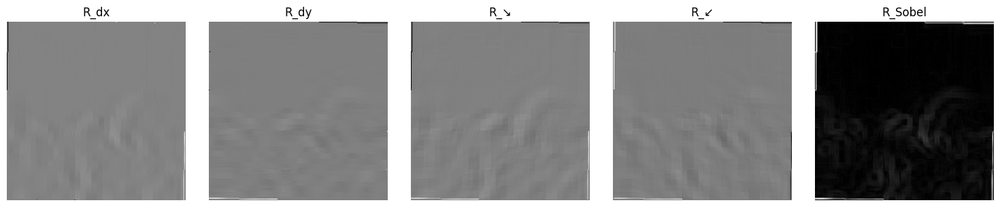

Label: 1, Edge shape: (224, 224, 15)


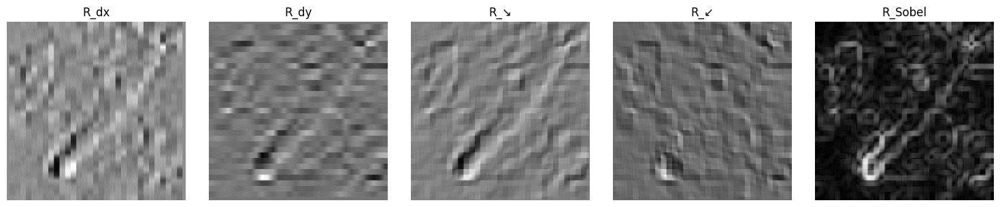

Label: 0, Edge shape: (224, 224, 15)


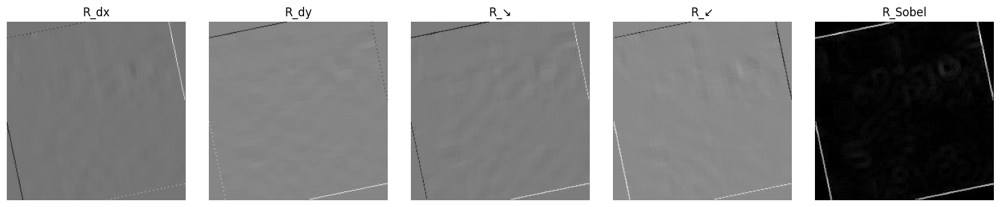

Label: 1, Edge shape: (224, 224, 15)


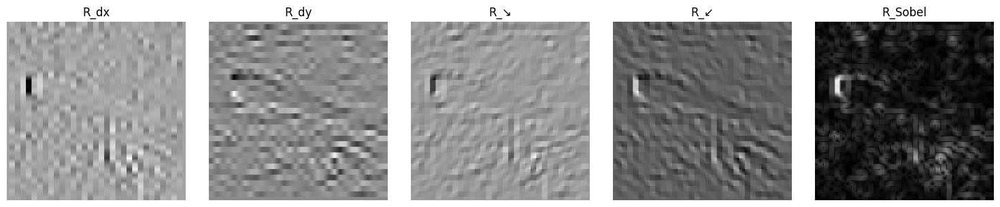

Label: 1, Edge shape: (224, 224, 15)


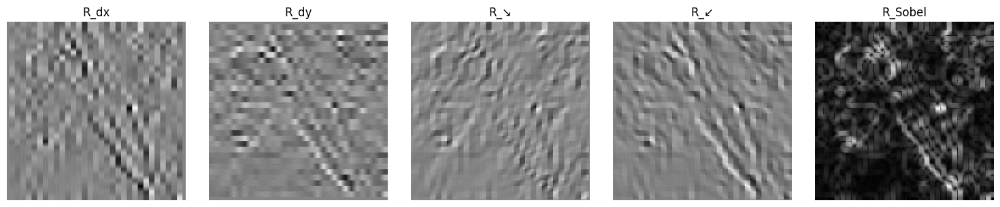

Label: 0, Edge shape: (224, 224, 15)


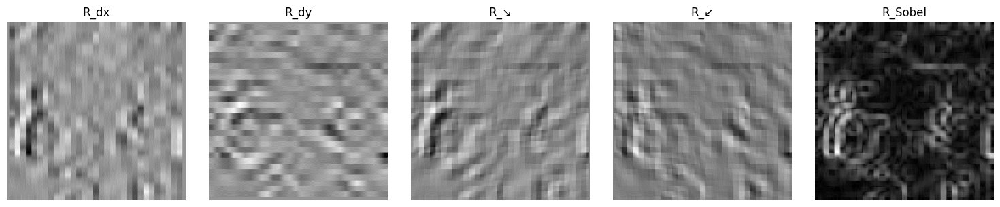

Label: 1, Edge shape: (224, 224, 15)


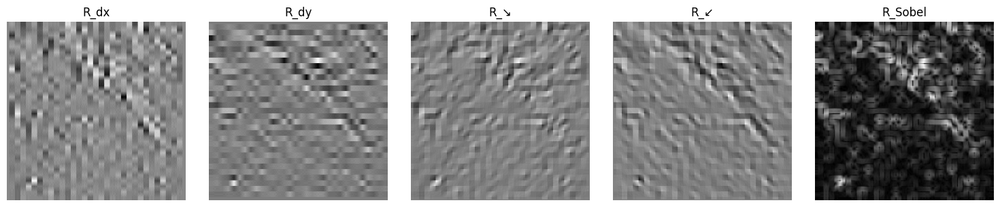

In [124]:
for i, (images, labels) in enumerate(training_dataloader):
    for img, label in zip(images, labels):
        edge_feat = compute_edge_features(img, use_sobel=True)

        print(f"Label: {label}, Edge shape: {edge_feat.shape}")

        # Feature visualization
        titles = ['R_dx', 'R_dy', 'R_↘', 'R_↙', 'R_Sobel']
        fig, axes = plt.subplots(1, 5, figsize=(15, 3))

        for idx, ax in enumerate(axes):
            ax.imshow(edge_feat[:, :, idx], cmap='gray')
            ax.set_title(titles[idx])
            ax.axis('off')

        plt.tight_layout()
        plt.show()

    break
